## 1. Data Loading and Combination



In [2]:
import pandas as pd

df = pd.read_csv('/content/synthetic_soil_moisture_dataset_2.csv')

print(df.head())
print(df.shape)

    location  day_index  temperature   rainfall   humidity  wind_speed  \
0  Bangalore          0    28.745071  10.072926  55.411657    3.388800   
1  Bangalore          1    27.913097   6.094384  50.579721    6.609879   
2  Bangalore          2    29.212484   4.069841  48.430690    4.345345   
3  Bangalore          3    30.645882   2.943528  57.661858    4.786021   
4  Bangalore          4    28.130387   1.691266  54.430019    3.736598   

      pressure  evaporation  soil_moisture  soil_lag1  soil_lag3  rain_7day  \
0  1010.074338     0.150405       0.550000   0.550000   0.550000  10.072926   
1  1012.701588     0.185517       0.556552   0.550000   0.550000  16.167309   
2  1008.743045     0.191590       0.555382   0.556552   0.550000  20.237150   
3  1015.274367     0.175391       0.531536   0.555382   0.550000  23.180678   
4  1014.149366     0.149737       0.517636   0.531536   0.556552  24.871944   

   soil_7day  day_of_year   sin_day   cos_day  moisture_diff  \
0   0.550000    

## 2. Preprocessing



In [3]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Sort by location and then by day_index
df = df.sort_values(by=['location', 'day_index']).reset_index(drop=True)

# Identify numerical features for normalization and filling
# All numerical columns except 'location' and 'day_index' and 'target_soil_moisture' will be features
# 'soil_moisture' is also an input feature representing current state
feature_numerical_features = [
    'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
    'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'rain_7day',
    'soil_7day', 'day_of_year', 'sin_day', 'cos_day', 'moisture_diff'
]
target_feature = 'target_soil_moisture'

# Create a copy to perform preprocessing steps and ensure 'location' column is preserved
df_processed = df.copy()

# Handle missing values using forward fill and backward fill for each numerical feature, grouped by location
for feature in feature_numerical_features + [target_feature]:
    df_processed[feature] = df_processed.groupby('location')[feature].transform(lambda x: x.ffill().bfill())

# After ffill and bfill, if any NaNs remain (e.g., a whole group was NaN), fill them.
for feature in feature_numerical_features + [target_feature]:
    if df_processed[feature].isnull().any():
        df_processed[feature] = df_processed[feature].fillna(df_processed[feature].mean())

# Initialize MinMaxScalers
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

# Apply normalization to feature numerical features
df_processed[feature_numerical_features] = feature_scaler.fit_transform(df_processed[feature_numerical_features])

# Apply normalization to the target feature separately
df_processed[target_feature] = target_scaler.fit_transform(df_processed[[target_feature]])

print("Data after preprocessing:")
display(df_processed.head())
print(f"Missing values after preprocessing: {df_processed.isnull().sum().sum()}")


Data after preprocessing:


,location,day_index,temperature,rainfall,humidity,wind_speed,pressure,evaporation,soil_moisture,soil_lag1,soil_lag3,rain_7day,soil_7day,day_of_year,sin_day,cos_day,moisture_diff,target_soil_moisture
0,Bangalore,0,0.527324,0.167882,0.411313,0.276867,0.384793,0.505826,0.552239,0.552239,0.552239,0.050537,0.552239,0.000000,0.508607,0.999926,0.266730,0.562018
1,Bangalore,1,0.493229,0.101573,0.343075,0.650198,0.511243,0.623913,0.562018,0.552239,0.552239,0.081114,0.557128,0.002747,0.517211,0.999704,0.289898,0.560272
2,Bangalore,2,0.546479,0.067831,0.312725,0.387733,0.320717,0.644336,0.560272,0.562018,0.552239,0.101533,0.558176,0.005495,0.525810,0.999333,0.262594,0.524680
3,Bangalore,3,0.605221,0.049059,0.443092,0.438809,0.635072,0.589859,0.524680,0.560272,0.552239,0.116301,0.549802,0.008242,0.534402,0.998815,0.182405,0.503935
4,Bangalore,4,0.502134,0.028188,0.397450,0.317178,0.580925,0.503582,0.503935,0.524680,0.562018,0.124786,0.540629,0.010989,0.542983,0.998149,0.217578,0.460530


Missing values after preprocessing: 0


## 3. Feature Engineering



In [4]:
import numpy as np


df_features = df_processed.copy()


df_features = df_features.sort_values(by=['location', 'day_index']).reset_index(drop=True)


all_potential_features = [
    'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
    'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'rain_7day',
    'soil_7day', 'day_of_year', 'sin_day', 'cos_day', 'moisture_diff', 'target_soil_moisture'
]
for feature in all_potential_features:
    if feature in df_features.columns:
        df_features[feature] = df_features.groupby('location')[feature].transform(lambda x: x.ffill().bfill())
        if df_features[feature].isnull().any():
            df_features[feature] = df_features[feature].fillna(0) # Fill with 0 or mean if still NaNs

print("Data after feature engineering (using pre-engineered features from CSV):")
display(df_features.head())
print(f"New DataFrame shape: {df_features.shape}")
print(f"Missing values after feature engineering: {df_features.isnull().sum().sum()}")


Data after feature engineering (using pre-engineered features from CSV):


,location,day_index,temperature,rainfall,humidity,wind_speed,pressure,evaporation,soil_moisture,soil_lag1,soil_lag3,rain_7day,soil_7day,day_of_year,sin_day,cos_day,moisture_diff,target_soil_moisture
0,Bangalore,0,0.527324,0.167882,0.411313,0.276867,0.384793,0.505826,0.552239,0.552239,0.552239,0.050537,0.552239,0.000000,0.508607,0.999926,0.266730,0.562018
1,Bangalore,1,0.493229,0.101573,0.343075,0.650198,0.511243,0.623913,0.562018,0.552239,0.552239,0.081114,0.557128,0.002747,0.517211,0.999704,0.289898,0.560272
2,Bangalore,2,0.546479,0.067831,0.312725,0.387733,0.320717,0.644336,0.560272,0.562018,0.552239,0.101533,0.558176,0.005495,0.525810,0.999333,0.262594,0.524680
3,Bangalore,3,0.605221,0.049059,0.443092,0.438809,0.635072,0.589859,0.524680,0.560272,0.552239,0.116301,0.549802,0.008242,0.534402,0.998815,0.182405,0.503935
4,Bangalore,4,0.502134,0.028188,0.397450,0.317178,0.580925,0.503582,0.503935,0.524680,0.562018,0.124786,0.540629,0.010989,0.542983,0.998149,0.217578,0.460530


New DataFrame shape: (25000, 18)
Missing values after feature engineering: 0


## 4. Sequence Creation



In [5]:
import numpy as np
import torch

# Define sequence parameters
window_size = 60 # Increased from 30 to 60

# Features to use for sequence creation (excluding 'location', 'day_index', and the target 'target_soil_moisture')
# These should be the features that were scaled together by feature_scaler in the preprocessing step
feature_cols = [
    'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
    'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'rain_7day',
    'soil_7day', 'day_of_year', 'sin_day', 'cos_day', 'moisture_diff'
]

# Initialize lists to store sequences and targets
all_sequences = []
all_targets = []

# Iterate through each location to create sequences independently
for location in df_features['location'].unique():
    location_df = df_features[df_features['location'] == location].copy()

    # Ensure data is sorted by day_index for correct sequence creation
    location_df = location_df.sort_values(by='day_index').reset_index(drop=True)

    # Extract features and target for this location
    features = location_df[feature_cols].values
    target = location_df['target_soil_moisture'].values # Changed to target_soil_moisture

    # Create sequences using a sliding window
    for i in range(len(location_df) - window_size):
        sequence = features[i:i + window_size]
        # Target is the target_soil_moisture of the day immediately following the sequence
        next_day_soil_moisture = target[i + window_size]

        all_sequences.append(sequence)
        all_targets.append(next_day_soil_moisture)

# Convert lists to NumPy arrays
X = np.array(all_sequences)
y = np.array(all_targets)

print(f"Shape of input sequences (X): {X.shape}")
print(f"Shape of target values (y): {y.shape}")

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32)

print(f"Shape of input sequences (X_tensor): {X_tensor.shape}")
print(f"Shape of target values (y_tensor): {y_tensor.shape}")


Shape of input sequences (X): (24700, 60, 15)
Shape of target values (y): (24700,)
Shape of input sequences (X_tensor): torch.Size([24700, 60, 15])
Shape of target values (y_tensor): torch.Size([24700])


## 5. Model Architecture: Decomposition-based Transformer



In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DecompositionLayer(nn.Module):
    """Decomposes input series into trend and residual using a moving average."""
    def __init__(self, kernel_size):
        super(DecompositionLayer, self).__init__()

        self.moving_avg = nn.AvgPool1d(kernel_size=kernel_size, stride=1, padding=kernel_size // 2, count_include_pad=False)

    def forward(self, x): # x: [Batch, Input_len, Feature_dim]
        original_seq_len = x.shape[1]

        # Permute to [Batch, Feature_dim, Input_len]
        x_permuted = x.permute(0, 2, 1)

        # Apply moving average. The output of moving_avg might have a different length.
        trend_raw = self.moving_avg(x_permuted)


        if trend_raw.shape[2] > original_seq_len:

            trend_sliced = trend_raw[:, :, :original_seq_len]
        elif trend_raw.shape[2] < original_seq_len:

            raise ValueError(f"Trend output sequence length ({trend_raw.shape[2]}) is shorter than input ({original_seq_len}).")
        else:
            trend_sliced = trend_raw

        trend = trend_sliced.permute(0, 2, 1) # Permute back to [Batch, Input_len, Feature_dim]
        residual = x - trend
        return trend, residual

class TransformerEncoderLayer(nn.Module):
    """A simple Transformer Encoder layer adapted for time series."""
    def __init__(self, d_model, nhead, dim_feedforward, dropout=0.4): # Increased dropout to 0.4
        super(TransformerEncoderLayer, self).__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout, batch_first=True)
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)

    def forward(self, src): # src: [Batch, Sequence_len, D_model]
        src2, _ = self.self_attn(src, src, src)
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        src2 = self.linear2(self.dropout(F.relu(self.linear1(src))))
        src = src + self.dropout2(src2)
        src = self.norm2(src)
        return src

class DecompositionTransformer(nn.Module):
    def __init__(self, feature_dim, model_dim, nhead, num_encoder_layers, dim_feedforward, dropout=0.4, trend_kernel_size=25): # Increased dropout to 0.4
        super(DecompositionTransformer, self).__init__()
        self.feature_dim = feature_dim
        self.model_dim = model_dim

        # 1. Input embedding to match model_dim (input projection layer)
        self.input_embedding = nn.Linear(feature_dim, model_dim)

        # 2. Decomposition Layer
        self.decomposition = DecompositionLayer(trend_kernel_size)

        # 3. Trend component processing

        self.trend_linear = nn.Linear(model_dim, 1) # Output a single value for trend

        # 4. Residual component processing using Transformer Encoder
        encoder_layers = [TransformerEncoderLayer(model_dim, nhead, dim_feedforward, dropout) for _ in range(num_encoder_layers)]
        self.transformer_encoder = nn.Sequential(*encoder_layers)

        self.residual_output = nn.Linear(model_dim, 1) # Output a single value for residual

        # 5. Final output layer to combine trend and residual predictions
        self.fc_out = nn.Linear(2, 1)
        self.dropout_layer = nn.Dropout(dropout)

    def forward(self, x): # x: [Batch, Sequence_len, Feature_dim]
        # 1. Input Embedding
        x_embed = self.input_embedding(x) # [Batch, Sequence_len, Model_dim]
        x_embed = self.dropout_layer(x_embed)

        # 2. Decompose into Trend and Residual
        trend_part, residual_part = self.decomposition(x_embed) # Both [Batch, Sequence_len, Model_dim]

        # 3. Process Trend Component

        trend_pred_input = trend_part[:, -1, :] # [Batch, Model_dim]
        trend_output = self.trend_linear(trend_pred_input) # [Batch, 1]

        # 4. Process Residual Component with Transformer

        transformer_output = self.transformer_encoder(residual_part)

        residual_output = self.residual_output(transformer_output[:, -1, :]) # [Batch, 1]

        # 5. Combine outputs
        combined_output = torch.cat((trend_output, residual_output), dim=-1) # [Batch, 2]
        final_prediction = self.fc_out(combined_output) # [Batch, 1]

        return final_prediction

# Define Hybrid Loss Function: 0.7 * MSE + 0.3 * MAE
class HybridLoss(nn.Module):
    def __init__(self, mse_weight=0.7, mae_weight=0.3):
        super(HybridLoss, self).__init__()
        self.mse_weight = mse_weight
        self.mae_weight = mae_weight
        self.mse_loss = nn.MSELoss()
        self.mae_loss = nn.L1Loss()

    def forward(self, outputs, targets):
        mse = self.mse_loss(outputs, targets)
        mae = self.mae_loss(outputs, targets)
        return self.mse_weight * mse + self.mae_weight * mae

## 6. Training



Training Samples: 19760
Validation Samples: 4940
Using Device: cuda
Starting Training...

Epoch [1/60] | Train Loss: 0.0431 | Val Loss: 0.0326
Epoch [2/60] | Train Loss: 0.0239 | Val Loss: 0.0355
Epoch [3/60] | Train Loss: 0.0226 | Val Loss: 0.0316
Epoch [4/60] | Train Loss: 0.0214 | Val Loss: 0.0235
Epoch [5/60] | Train Loss: 0.0214 | Val Loss: 0.0266
Epoch [6/60] | Train Loss: 0.0209 | Val Loss: 0.0307
Epoch [7/60] | Train Loss: 0.0205 | Val Loss: 0.0247
Epoch [8/60] | Train Loss: 0.0204 | Val Loss: 0.0331
Epoch [9/60] | Train Loss: 0.0202 | Val Loss: 0.0240
Epoch [10/60] | Train Loss: 0.0201 | Val Loss: 0.0245
Epoch [11/60] | Train Loss: 0.0201 | Val Loss: 0.0344
Epoch [12/60] | Train Loss: 0.0200 | Val Loss: 0.0250
Epoch [13/60] | Train Loss: 0.0203 | Val Loss: 0.0243
Epoch [14/60] | Train Loss: 0.0200 | Val Loss: 0.0246
Epoch [15/60] | Train Loss: 0.0199 | Val Loss: 0.0327
Epoch [16/60] | Train Loss: 0.0200 | Val Loss: 0.0255
Epoch [17/60] | Train Loss: 0.0199 | Val Loss: 0.0266
E

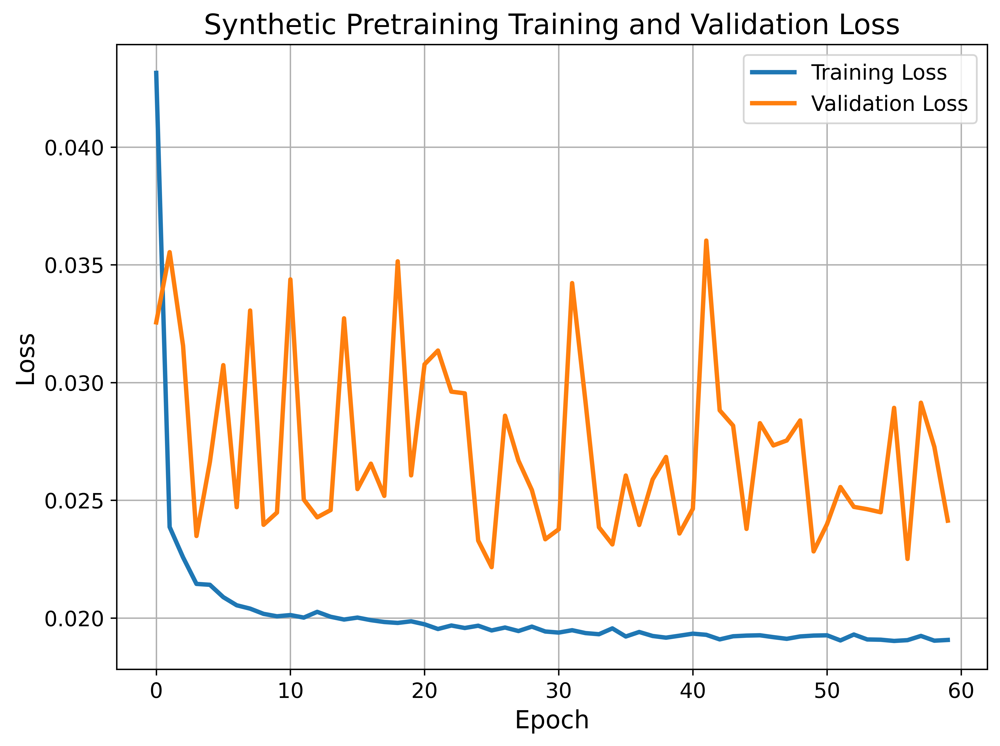

In [7]:
# ============================================================
# 6. TRAINING
# ============================================================

import torch
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# ============================================================
# Train / Validation Split
# ============================================================

X_train, X_val, y_train, y_val = train_test_split(
    X,
    y,
    test_size=0.2,
    shuffle=False
)

# ============================================================
# Convert to Tensors
# ============================================================

X_train_tensor = torch.tensor(
    X_train,
    dtype=torch.float32
)

y_train_tensor = torch.tensor(
    y_train,
    dtype=torch.float32
)

X_val_tensor = torch.tensor(
    X_val,
    dtype=torch.float32
)

y_val_tensor = torch.tensor(
    y_val,
    dtype=torch.float32
)

# ============================================================
# Create DataLoaders
# ============================================================

batch_size = 64

train_dataset = TensorDataset(
    X_train_tensor,
    y_train_tensor
)

val_dataset = TensorDataset(
    X_val_tensor,
    y_val_tensor
)

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)

print(f"Training Samples: {len(train_dataset)}")
print(f"Validation Samples: {len(val_dataset)}")

# ============================================================
# Model Configuration
# ============================================================

sequence_length = X.shape[1]
feature_dimension = X.shape[2]

model = DecompositionTransformer(
    feature_dim=feature_dimension,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.1,
    trend_kernel_size=25
)

# ============================================================
# Device Configuration
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

model = model.to(device)

print(f"Using Device: {device}")

# ============================================================
# Loss + Optimizer
# ============================================================

criterion = HybridLoss(mse_weight=0.7, mae_weight=0.3) # Updated to new signature

optimizer = optim.Adam(
    model.parameters(),
    lr=0.001
)

# ============================================================
# Training Loop
# ============================================================

num_epochs = 60

train_losses = []
val_losses = []

print("Starting Training...\n")

for epoch in range(num_epochs):

    # ========================================================
    # TRAINING
    # ========================================================

    model.train()

    running_train_loss = 0.0

    for inputs, targets in train_loader:

        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()

        outputs = model(inputs)

        loss = criterion(outputs.squeeze(), targets) # Squeeze output to match target shape

        loss.backward()

        optimizer.step()

        running_train_loss += (
            loss.item() * inputs.size(0)
        )

    epoch_train_loss = (
        running_train_loss / len(train_dataset)
    )

    train_losses.append(epoch_train_loss)

    # ========================================================
    # VALIDATION
    # ========================================================

    model.eval()

    running_val_loss = 0.0

    with torch.no_grad():

        for inputs, targets in val_loader:

            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)

            loss = criterion(outputs.squeeze(), targets) # Squeeze output to match target shape

            running_val_loss += (
                loss.item() * inputs.size(0)
            )

    epoch_val_loss = (
        running_val_loss / len(val_dataset)
    )

    val_losses.append(epoch_val_loss)

    # ========================================================
    # Print Progress
    # ========================================================

    print(
        f"Epoch [{epoch+1}/{num_epochs}] | "
        f"Train Loss: {epoch_train_loss:.4f} | "
        f"Val Loss: {epoch_val_loss:.4f}"
    )

# ============================================================
# Save Model
# ============================================================

torch.save(
    model.state_dict(),
    "soil_moisture_model.pth"
)

print("\nTraining Complete.")
print("Model saved as soil_moisture_model.pth")

# ============================================================
# Plot Loss Curves
# ============================================================



plt.figure(
    figsize=(8, 6),
    dpi=600
)

plt.plot(
    train_losses,
    linewidth=2.5,
    label="Training Loss"
)

plt.plot(
    val_losses,
    linewidth=2.5,
    label="Validation Loss"
)

plt.xlabel(
    "Epoch",
    fontsize=14
)

plt.ylabel(
    "Loss",
    fontsize=14
)

plt.title(
    "Synthetic Pretraining Training and Validation Loss",
    fontsize=16
)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.legend(
    fontsize=12
)

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "synthetic_pretraining_loss_curve.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

## 7. Model Evaluation




Evaluation Metrics on Validation Set (Original Scale):
RMSE: 0.0614
MAE: 0.0408
R-squared: 0.8667


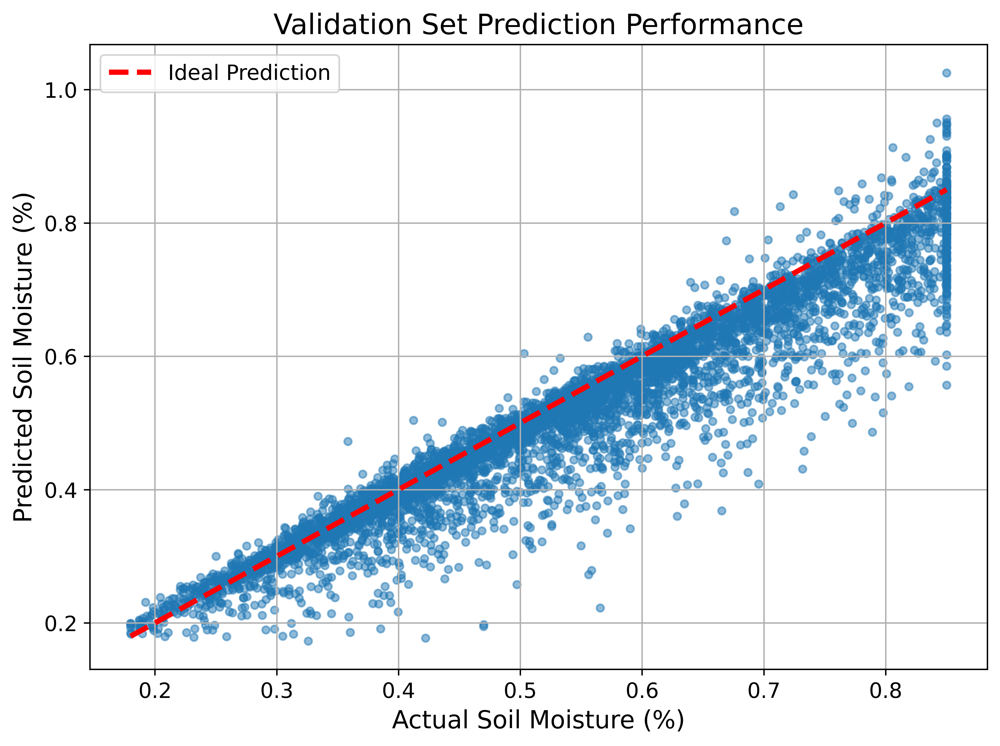

In [8]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F



# Instantiate the model with the updated parameters matching the training configuration
feature_dimension = X_tensor.shape[2] # 15 (input features for transformer)
model_dim = 128 # Dimension of the model
nhead = 8     # Number of attention heads
num_encoder_layers = 3 # Number of transformer encoder layers
dim_feedforward = 256 # Dimension of the feedforward network in transformer
dropout_rate = 0.1
trend_kernel_size = 25 # Kernel size for moving average in decomposition

model_eval = DecompositionTransformer(
    feature_dim=feature_dimension,
    model_dim=model_dim,
    nhead=nhead,
    num_encoder_layers=num_encoder_layers,
    dim_feedforward=dim_feedforward,
    dropout=dropout_rate,
    trend_kernel_size=trend_kernel_size
)

# Move model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the state dictionary
model_eval.load_state_dict(torch.load('soil_moisture_model.pth', map_location=device))
model_eval.to(device)
model_eval.eval() # Set model to evaluation mode

predictions = []
actuals = []

with torch.no_grad():
    for inputs, targets in val_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model_eval(inputs)
        predictions.extend(outputs.squeeze().cpu().numpy())
        actuals.extend(targets.cpu().numpy())

# Convert to numpy arrays
predictions = np.array(predictions)
actuals = np.array(actuals)

predictions_original_scale = target_scaler.inverse_transform(predictions.reshape(-1, 1)).flatten()
actuals_original_scale = target_scaler.inverse_transform(actuals.reshape(-1, 1)).flatten()

# Calculate evaluation metrics on original scale
rmse = np.sqrt(mean_squared_error(actuals_original_scale, predictions_original_scale))
mae = mean_absolute_error(actuals_original_scale, predictions_original_scale)
r2 = r2_score(actuals_original_scale, predictions_original_scale)

print(f"\nEvaluation Metrics on Validation Set (Original Scale):")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R-squared: {r2:.4f}")

# Visualize actual vs. predicted values

plt.figure(
    figsize=(8, 6),
    dpi=600
)

plt.scatter(
    actuals_original_scale,
    predictions_original_scale,
    alpha=0.5,
    s=18
)

plt.plot(
    [
        actuals_original_scale.min(),
        actuals_original_scale.max()
    ],
    [
        actuals_original_scale.min(),
        actuals_original_scale.max()
    ],
    'r--',
    linewidth=3,
    label='Ideal Prediction'
)

plt.xlabel(
    "Actual Soil Moisture (%)",
    fontsize=14
)

plt.ylabel(
    "Predicted Soil Moisture (%)",
    fontsize=14
)

plt.title(
    "Validation Set Prediction Performance",
    fontsize=16
)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.legend(
    fontsize=12
)

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "validation_prediction_performance.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

## 8.1 Cross-Validation by Location



In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader



# Get unique locations
unique_locations = df_features['location'].unique()

# Prepare feature_cols (should be same as used in sequence creation)
feature_cols = [
    'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
    'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'rain_7day',
    'soil_7day', 'day_of_year', 'sin_day', 'cos_day', 'moisture_diff'
]

# Define model parameters (should match those used in training)
feature_dimension = X_tensor.shape[2]
model_dim = 128
nhead = 8
num_encoder_layers = 3
dim_feedforward = 256
dropout_rate = 0.1
trend_kernel_size = 25
num_epochs_cv = 30 # Reduced epochs for faster cross-validation demonstration
batch_size = 64

# Store results for each fold
cv_rmse = []
cv_mae = []
cv_r2 = []

print(f"Starting cross-validation across {len(unique_locations)} locations...")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

for i, val_location in enumerate(unique_locations):
    print(f"\n--- Cross-Validation Fold {i+1}/{len(unique_locations)}: Validating on {val_location} ---")

    # Split data based on location
    train_indices = df_features[df_features['location'] != val_location].index
    val_indices = df_features[df_features['location'] == val_location].index

    all_sequences_fold = []
    all_targets_fold = []

    # Get original (unsequenced) data for train/val split based on location
    df_train_loc = df_features[df_features['location'] != val_location].copy()
    df_val_loc = df_features[df_features['location'] == val_location].copy()

    # Function to create sequences from a dataframe slice
    def create_sequences_from_df(df_slice):
        sequences = []
        targets = []
        features_vals = df_slice[feature_cols].values
        target_vals = df_slice['target_soil_moisture'].values # Target is 'target_soil_moisture'
        for j in range(len(df_slice) - window_size):
            sequences.append(features_vals[j : j + window_size])
            targets.append(target_vals[j + window_size])
        return np.array(sequences), np.array(targets)

    X_train_np, y_train_np = create_sequences_from_df(df_train_loc)
    X_val_np, y_val_np = create_sequences_from_df(df_val_loc)

    if len(X_train_np) == 0 or len(X_val_np) == 0:
        print(f"Skipping fold {val_location} due to insufficient data.")
        continue

    # Convert to PyTorch tensors
    X_train_tensor = torch.tensor(X_train_np, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train_np, dtype=torch.float32)
    X_val_tensor = torch.tensor(X_val_np, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val_np, dtype=torch.float32)

    train_dataset_fold = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset_fold = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader_fold = DataLoader(train_dataset_fold, batch_size=batch_size, shuffle=True)
    val_loader_fold = DataLoader(val_dataset_fold, batch_size=batch_size, shuffle=False)

    # Instantiate a new model for each fold
    model_fold = DecompositionTransformer(
        feature_dim=feature_dimension,
        model_dim=model_dim,
        nhead=nhead,
        num_encoder_layers=num_encoder_layers,
        dim_feedforward=dim_feedforward,
        dropout=dropout_rate,
        trend_kernel_size=trend_kernel_size
    ).to(device)

    criterion_fold = HybridLoss()
    optimizer_fold = optim.Adam(model_fold.parameters(), lr=0.001)

    # Training loop for the current fold
    for epoch in range(num_epochs_cv):
        model_fold.train()
        train_loss_fold = 0.0
        for inputs, targets in train_loader_fold:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer_fold.zero_grad()
            outputs = model_fold(inputs)
            loss = criterion_fold(outputs.squeeze(), targets)
            loss.backward()
            optimizer_fold.step()
            train_loss_fold += loss.item() * inputs.size(0)
        train_loss_fold /= len(train_dataset_fold)

        # Validation phase for the current fold
        model_fold.eval()
        val_loss_fold = 0.0
        predictions_fold = []
        actuals_fold = []
        with torch.no_grad():
            for inputs, targets in val_loader_fold:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model_fold(inputs)
                val_loss_fold += criterion_fold(outputs.squeeze(), targets).item() * inputs.size(0)
                predictions_fold.extend(outputs.squeeze().cpu().numpy())
                actuals_fold.extend(targets.cpu().numpy())
        val_loss_fold /= len(val_dataset_fold)

        if (epoch + 1) % 10 == 0 or epoch == num_epochs_cv - 1:
            print(f'  Epoch {epoch+1}/{num_epochs_cv}, Train Loss: {train_loss_fold:.4f}, Val Loss: {val_loss_fold:.4f}')

    # Evaluate fold metrics
    predictions_fold_original_scale = target_scaler.inverse_transform(np.array(predictions_fold).reshape(-1, 1)).flatten()
    actuals_fold_original_scale = target_scaler.inverse_transform(np.array(actuals_fold).reshape(-1, 1)).flatten()

    rmse_fold = np.sqrt(mean_squared_error(actuals_fold_original_scale, predictions_fold_original_scale))
    mae_fold = mean_absolute_error(actuals_fold_original_scale, predictions_fold_original_scale)
    r2_fold = r2_score(actuals_fold_original_scale, predictions_fold_original_scale)

    cv_rmse.append(rmse_fold)
    cv_mae.append(mae_fold)
    cv_r2.append(r2_fold)

    print(f"  {val_location} Metrics: RMSE={rmse_fold:.4f}, MAE={mae_fold:.4f}, R-squared={r2_fold:.4f}")

# Aggregate and display cross-validation results
print("\n--- Cross-Validation Results (Average across all locations) ---")
print(f"Average RMSE: {np.mean(cv_rmse):.4f} (Std: {np.std(cv_rmse):.4f})")
print(f"Average MAE: {np.mean(cv_mae):.4f} (Std: {np.std(cv_mae):.4f})")
print(f"Average R-squared: {np.mean(cv_r2):.4f} (Std: {np.std(cv_r2):.4f})")

Starting cross-validation across 5 locations...

--- Cross-Validation Fold 1/5: Validating on Bangalore ---
  Epoch 10/30, Train Loss: 0.0203, Val Loss: 0.0386
  Epoch 20/30, Train Loss: 0.0197, Val Loss: 0.0375
  Epoch 30/30, Train Loss: 0.0196, Val Loss: 0.0297
  Bangalore Metrics: RMSE=0.0692, MAE=0.0497, R-squared=0.8525

--- Cross-Validation Fold 2/5: Validating on Chennai ---
  Epoch 10/30, Train Loss: 0.0203, Val Loss: 0.0236
  Epoch 20/30, Train Loss: 0.0198, Val Loss: 0.0331
  Epoch 30/30, Train Loss: 0.0196, Val Loss: 0.0340
  Chennai Metrics: RMSE=0.0761, MAE=0.0558, R-squared=0.8377

--- Cross-Validation Fold 3/5: Validating on Hyderabad ---
  Epoch 10/30, Train Loss: 0.0206, Val Loss: 0.0304
  Epoch 20/30, Train Loss: 0.0200, Val Loss: 0.0275
  Epoch 30/30, Train Loss: 0.0193, Val Loss: 0.0215
  Hyderabad Metrics: RMSE=0.0532, MAE=0.0382, R-squared=0.9142

--- Cross-Validation Fold 4/5: Validating on Mumbai ---
  Epoch 10/30, Train Loss: 0.0204, Val Loss: 0.0223
  Epoch 20

## 8.2 Visualize Actual vs. Predicted for Each Location



Generating individual location plots...
Processing location: Bengaluru


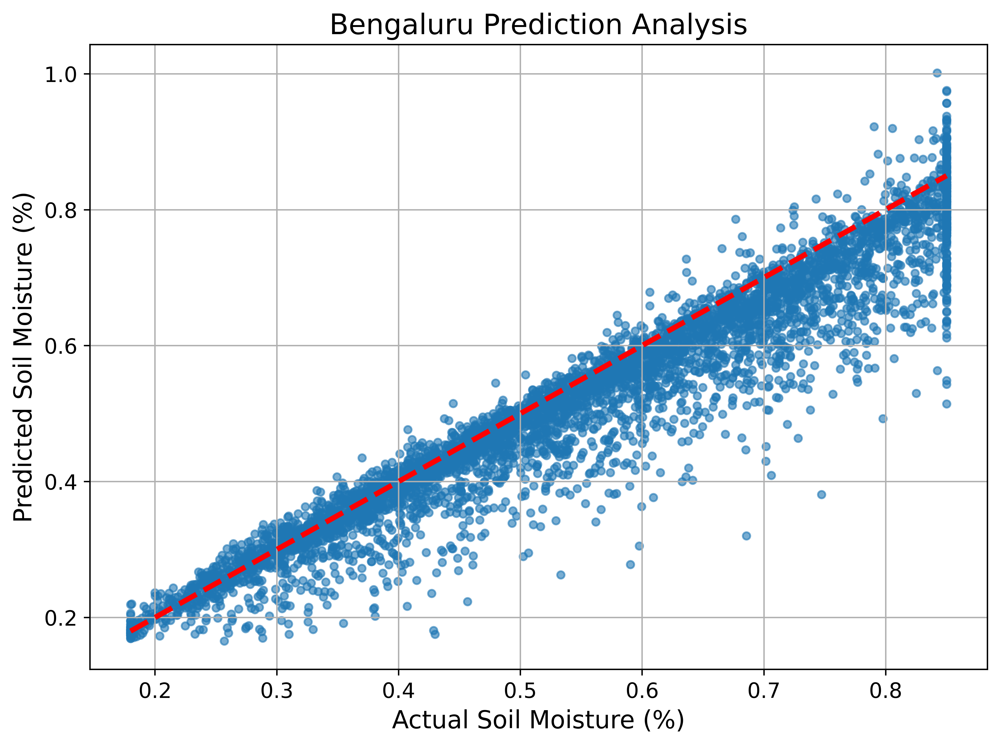

Processing location: Chennai


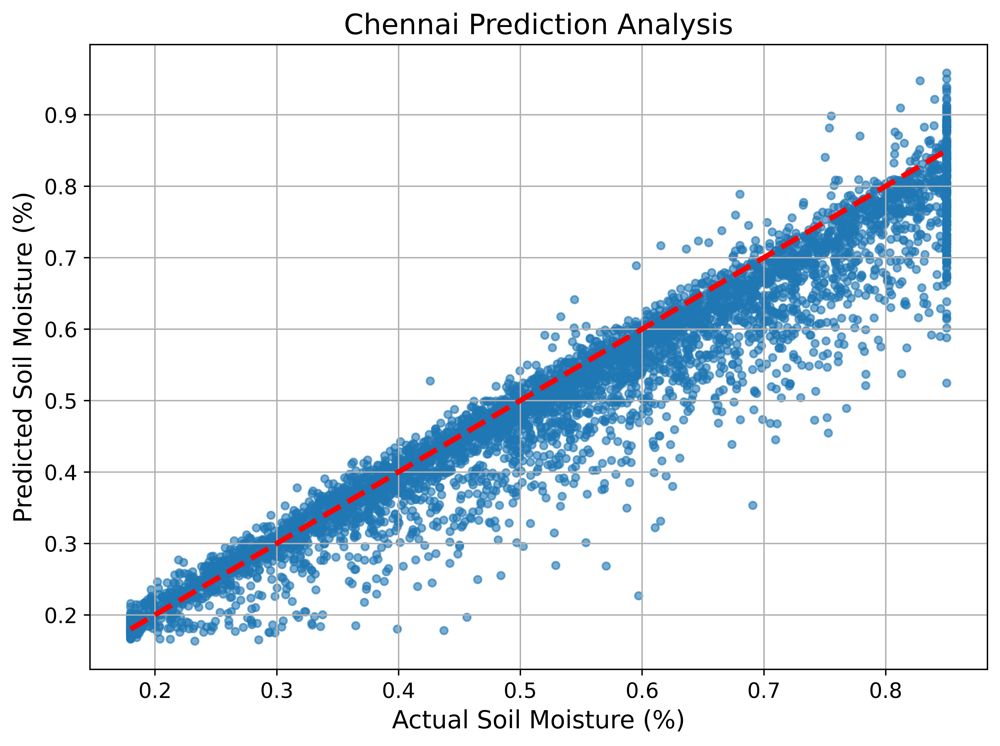

Processing location: Hyderabad


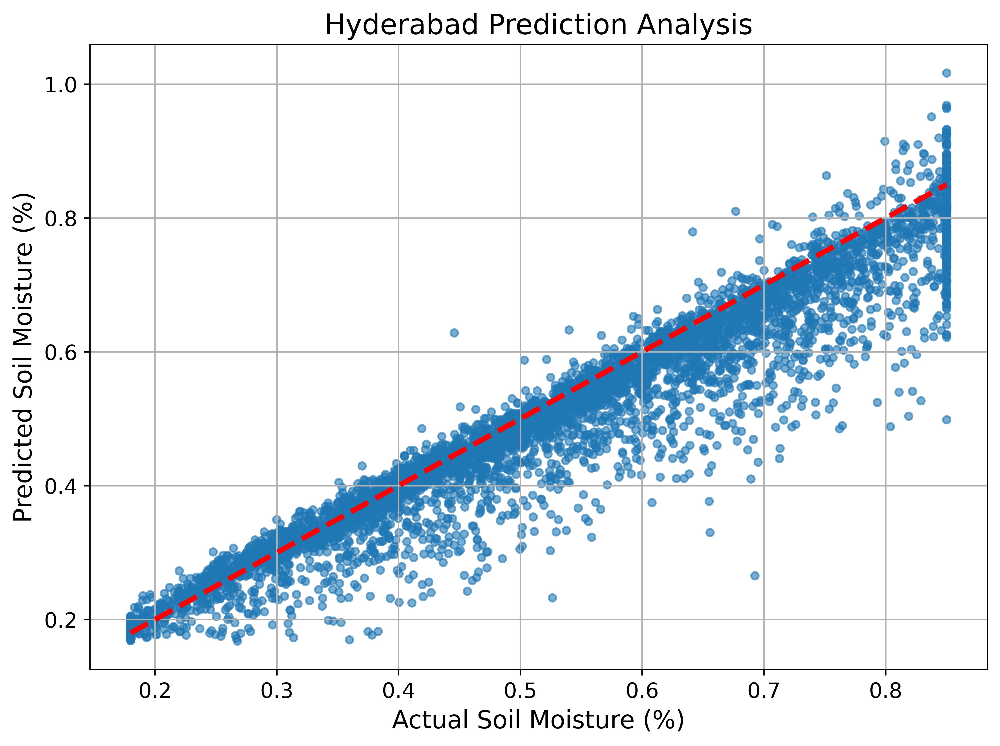

Processing location: Mumbai


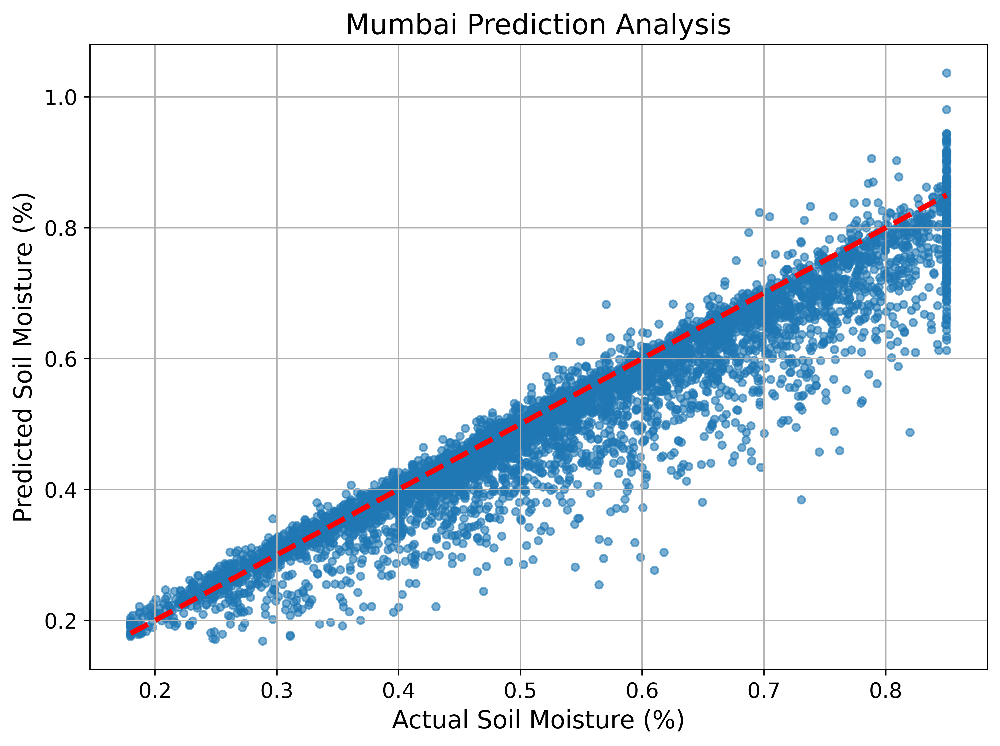

Processing location: Pune


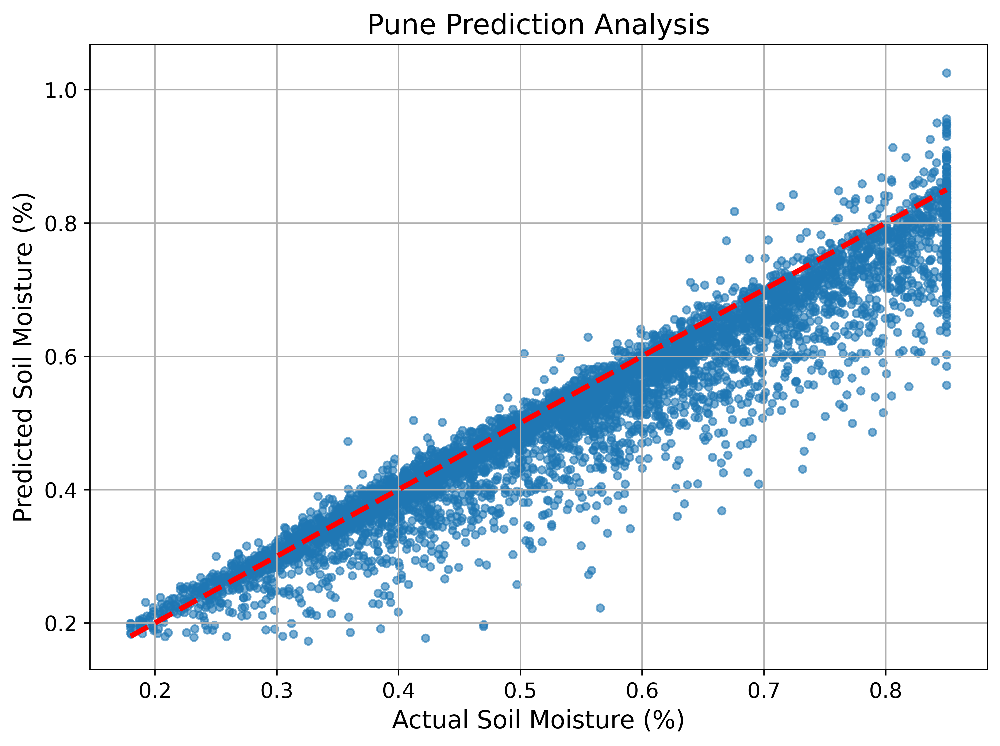

Finished plotting for all locations.


In [10]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader

# ============================================================
# MODEL SETUP
# ============================================================

feature_dimension = X_tensor.shape[2]

model_individual_location = DecompositionTransformer(
    feature_dim=feature_dimension,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.1,
    trend_kernel_size=25
)

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

model_individual_location.load_state_dict(
    torch.load(
        "soil_moisture_model.pth",
        map_location=device
    )
)

model_individual_location.to(device)
model_individual_location.eval()

# ============================================================
# LOCATION NAME FIX
# ============================================================

location_name_mapping = {
    "Bangalore": "Bengaluru"
}

# ============================================================
# DATA PREPARATION
# ============================================================

window_size = 60
batch_size = 64

unique_locations = df_features["location"].unique()

feature_cols = [
    'temperature',
    'rainfall',
    'humidity',
    'wind_speed',
    'pressure',
    'evaporation',
    'soil_moisture',
    'soil_lag1',
    'soil_lag3',
    'rain_7day',
    'soil_7day',
    'day_of_year',
    'sin_day',
    'cos_day',
    'moisture_diff'
]

def create_sequences_from_df(df_slice):

    sequences = []
    targets = []

    features_vals = df_slice[feature_cols].values
    target_vals = df_slice['target_soil_moisture'].values

    for j in range(len(df_slice) - window_size):

        sequences.append(
            features_vals[j : j + window_size]
        )

        targets.append(
            target_vals[j + window_size]
        )

    return (
        np.array(sequences),
        np.array(targets)
    )

# ============================================================
# GENERATE FIGURES
# ============================================================

print("Generating individual location plots...")

for location in unique_locations:

    display_location = location_name_mapping.get(
        location,
        location
    )

    print(
        f"Processing location: {display_location}"
    )

    location_df = df_features[
        df_features["location"] == location
    ].copy()

    location_df = location_df.sort_values(
        by="day_index"
    ).reset_index(drop=True)

    X_location_np, y_location_np = (
        create_sequences_from_df(location_df)
    )

    if len(X_location_np) == 0:

        print(
            f"Skipping {display_location}: "
            "Insufficient data."
        )

        continue

    X_location_tensor = torch.tensor(
        X_location_np,
        dtype=torch.float32
    )

    y_location_tensor = torch.tensor(
        y_location_np,
        dtype=torch.float32
    )

    location_dataset = TensorDataset(
        X_location_tensor,
        y_location_tensor
    )

    location_loader = DataLoader(
        location_dataset,
        batch_size=batch_size,
        shuffle=False
    )

    predictions_loc = []
    actuals_loc = []

    with torch.no_grad():

        for inputs, targets in location_loader:

            inputs = inputs.to(device)

            outputs = model_individual_location(
                inputs
            )

            predictions_loc.extend(
                outputs.squeeze()
                .cpu()
                .numpy()
            )

            actuals_loc.extend(
                targets.numpy()
            )

    predictions_loc = np.array(
        predictions_loc
    )

    actuals_loc = np.array(
        actuals_loc
    )

    predictions_original = (
        target_scaler.inverse_transform(
            predictions_loc.reshape(-1, 1)
        ).flatten()
    )

    actuals_original = (
        target_scaler.inverse_transform(
            actuals_loc.reshape(-1, 1)
        ).flatten()
    )

    # ========================================================
    # JOURNAL QUALITY FIGURE
    # ========================================================

    plt.figure(
        figsize=(8, 6),
        dpi=600
    )

    plt.scatter(
        actuals_original,
        predictions_original,
        alpha=0.6,
        s=18
    )

    plt.plot(
        [
            actuals_original.min(),
            actuals_original.max()
        ],
        [
            actuals_original.min(),
            actuals_original.max()
        ],
        'r--',
        linewidth=3,
        label='Ideal Prediction'
    )

    plt.xlabel(
        "Actual Soil Moisture (%)",
        fontsize=14
    )

    plt.ylabel(
        "Predicted Soil Moisture (%)",
        fontsize=14
    )

    plt.title(
        f"{display_location} Prediction Analysis",
        fontsize=16
    )

    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.grid(True)

    plt.tight_layout()

    plt.savefig(
        f"{display_location}_prediction_analysis.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()

print(
    "Finished plotting for all locations."
)

## 9. Transfer Learning with REAL ERA5 Data



### 9.1 Generate Synthetic ERA5 Dataset



In [11]:
import pandas as pd
import numpy as np
import os

def load_and_engineer_real_era5_data(file_paths):
    all_dfs = []
    location_map = {
        'bng': 'Bengaluru',
        'che': 'Chennai',
        'hyd': 'Hyderabad',
        'mum': 'Mumbai',
        'pun': 'Pune' # Adding Pune based on possible future data or consistency
    }

    for file_path in file_paths:
        df_loc = pd.read_csv(file_path)

        # Define a mapping for ERA5-specific column names to the expected feature names
        era5_column_rename_map = {
            'volumetric_soil_water_layer_1': 'soil_moisture',
            'temperature_2m': 'temperature',
            'total_precipitation_sum': 'rainfall',
            'surface_pressure': 'pressure',
            'total_evaporation_sum': 'evaporation'
            # 'humidity' is often 'relative_humidity_2m' in ERA5, but we'll add a placeholder if not found
        }

        # Apply direct renames
        df_loc = df_loc.rename(columns={k: v for k, v in era5_column_rename_map.items() if k in df_loc.columns})

        # If 'soil_moisture' is still not found after direct rename, try a more general search (though specific rename is preferred)
        if 'soil_moisture' not in df_loc.columns:
            found_soil_moisture_col = None
            for col in df_loc.columns:
                if ('soil' in col.lower() and 'moisture' in col.lower()) or ('volumetric' in col.lower() and 'soil' in col.lower() and 'water' in col.lower()):
                    found_soil_moisture_col = col
                    break

            if found_soil_moisture_col and found_soil_moisture_col != 'soil_moisture': # Rename if found and not already correct
                df_loc = df_loc.rename(columns={found_soil_moisture_col: 'soil_moisture'})
                print(f"Renamed column '{found_soil_moisture_col}' to 'soil_moisture' in {os.path.basename(file_path)}")
            elif not found_soil_moisture_col: # If still not found
                raise KeyError(f"Critical Error: 'soil_moisture' column not found or inferable in "
                               f"{os.path.basename(file_path)}. Available columns: {df_loc.columns.tolist()}")

        # Derive wind_speed from u and v components if available
        if 'u_component_of_wind_10m' in df_loc.columns and 'v_component_of_wind_10m' in df_loc.columns:
            df_loc['wind_speed'] = np.sqrt(df_loc['u_component_of_wind_10m']**2 + df_loc['v_component_of_wind_10m']**2)
            df_loc = df_loc.drop(columns=['u_component_of_wind_10m', 'v_component_of_wind_10m'])
            print(f"Derived 'wind_speed' from u and v components in {os.path.basename(file_path)}")
        elif 'wind_speed' not in df_loc.columns: # If wind_speed is not derived and not directly present
            df_loc['wind_speed'] = np.nan # Add placeholder for imputation
            print(f"Added 'wind_speed' column with NaN values for imputation in {os.path.basename(file_path)}")

        # Add a placeholder for 'humidity' if not found, it will be imputed later
        if 'humidity' not in df_loc.columns:
            df_loc['humidity'] = np.nan
            print(f"Added 'humidity' column with NaN values for imputation in {os.path.basename(file_path)}")

        # Extract location name from file path
        base_name = os.path.basename(file_path)
        location_code = base_name.split('_')[1].replace('data.csv', '')
        location_name = location_map.get(location_code, location_code.capitalize()) # Default to capitalized code if not in map

        df_loc['location'] = location_name
        all_dfs.append(df_loc)

    df_era5 = pd.concat(all_dfs, ignore_index=True)
    print(f"DEBUG: Shape after concat: {df_era5.shape}")

    # Ensure 'date' column is datetime and then sort
    df_era5['date'] = pd.to_datetime(df_era5['date'], format='mixed', dayfirst=True)
    df_era5 = df_era5.sort_values(by=['location', 'date']).reset_index(drop=True)
    print(f"DEBUG: Shape after date conversion and sort: {df_era5.shape}")

    # Re-engineer features to ensure consistency and handle any missing ones from raw data
    df_era5['soil_lag1'] = df_era5.groupby('location')['soil_moisture'].shift(1)
    df_era5['soil_lag3'] = df_era5.groupby('location')['soil_moisture'].shift(3)
    df_era5['soil_roll7'] = df_era5.groupby('location')['soil_moisture'].rolling(window=7, min_periods=1).mean().reset_index(level=0, drop=True)
    df_era5['soil_roll14'] = df_era5.groupby('location')['soil_moisture'].rolling(window=14, min_periods=1).mean().reset_index(level=0, drop=True)
    df_era5['rain_7day'] = df_era5.groupby('location')['rainfall'].rolling(window=7, min_periods=1).sum().reset_index(level=0, drop=True)
    df_era5['day_of_year'] = df_era5['date'].dt.dayofyear
    df_era5['sin_day'] = np.sin(2 * np.pi * df_era5['day_of_year'] / 365)
    df_era5['cos_day'] = np.cos(2 * np.pi * df_era5['day_of_year'] / 365)
    df_era5['moisture_diff'] = df_era5.groupby('location')['soil_moisture'].diff().fillna(0)

    # Target feature (next day's soil moisture)
    df_era5['target_soil_moisture'] = df_era5.groupby('location')['soil_moisture'].shift(-1)

    print(f"DEBUG: Shape after feature engineering: {df_era5.shape}")
    print(f"DEBUG: NaNs after feature engineering:\n{df_era5.isnull().sum()[df_era5.isnull().sum() > 0]}")



    return df_era5


real_era5_file_paths = [
    '/content/soil_bngdata.csv',
    '/content/soil_hyddata.csv',
    '/content/soil_mumdata.csv',

]

df_era5 = load_and_engineer_real_era5_data(real_era5_file_paths)

print("Real ERA5 Dataset Head (after loading and engineering features):")
display(df_era5.head())
print(f"Real ERA5 Dataset Shape: {df_era5.shape}")
print(f"Missing values in Real ERA5 dataset: {df_era5.isnull().sum().sum()}")

Derived 'wind_speed' from u and v components in soil_bngdata.csv
Added 'humidity' column with NaN values for imputation in soil_bngdata.csv
Derived 'wind_speed' from u and v components in soil_hyddata.csv
Added 'humidity' column with NaN values for imputation in soil_hyddata.csv
Derived 'wind_speed' from u and v components in soil_mumdata.csv
Added 'humidity' column with NaN values for imputation in soil_mumdata.csv
DEBUG: Shape after concat: (15297, 9)
DEBUG: Shape after date conversion and sort: (15297, 9)
DEBUG: Shape after feature engineering: (15297, 19)
DEBUG: NaNs after feature engineering:
humidity                15297
soil_lag1                   3
soil_lag3                   9
target_soil_moisture        3
dtype: int64
Real ERA5 Dataset Head (after loading and engineering features):


,date,pressure,temperature,evaporation,rainfall,soil_moisture,wind_speed,humidity,location,soil_lag1,soil_lag3,soil_roll7,soil_roll14,rain_7day,day_of_year,sin_day,cos_day,moisture_diff,target_soil_moisture
0,2010-01-01,91130.47689,293.638805,-0.002764,2.920000e-06,0.425994,3.047630,NaN,Bengaluru,NaN,NaN,0.425994,0.425994,0.000003,1,0.017213,0.999852,0.000000,0.401089
1,2010-01-02,91259.26790,293.186637,-0.003230,6.220000e-06,0.401089,2.708495,NaN,Bengaluru,0.425994,NaN,0.413542,0.413542,0.000009,2,0.034422,0.999407,-0.024905,0.382526
2,2010-01-03,91235.09554,292.583660,-0.003047,1.560000e-05,0.382526,1.924145,NaN,Bengaluru,0.401089,NaN,0.403203,0.403203,0.000025,3,0.051620,0.998667,-0.018564,0.366552
3,2010-01-04,91060.95329,292.671733,-0.003214,2.340000e-06,0.366552,1.854978,NaN,Bengaluru,0.382526,0.425994,0.394040,0.394040,0.000027,4,0.068802,0.997630,-0.015974,0.351880
4,2010-01-05,90944.38509,293.688966,-0.003193,4.350000e-07,0.351880,2.277938,NaN,Bengaluru,0.366552,0.401089,0.385608,0.385608,0.000028,5,0.085965,0.996298,-0.014671,0.339379


Real ERA5 Dataset Shape: (15297, 19)
Missing values in Real ERA5 dataset: 15312


### 9.2 Preprocess ERA5 Dataset



In [12]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import pandas as pd

# Ensure 'date' column is datetime and then sort
df_era5['date'] = pd.to_datetime(df_era5['date'])
df_era5 = df_era5.sort_values(by=['location', 'date']).reset_index(drop=True)

# Identify numerical features
era5_feature_numerical_features = [
    'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
    'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'soil_roll7', 'soil_roll14', 'rain_7day',
    'day_of_year', 'sin_day', 'cos_day', 'moisture_diff'
]
era5_target_feature = 'target_soil_moisture'

# Create a copy to perform preprocessing steps
df_era5_processed = df_era5.copy()

# Handle missing values robustly
for feature in era5_feature_numerical_features + [era5_target_feature]:
    # 1. Forward/Backward fill within location groups
    df_era5_processed[feature] = df_era5_processed.groupby('location')[feature].transform(lambda x: x.ffill().bfill())

    # 2. Global mean fill if NaNs remain
    if df_era5_processed[feature].isnull().any():
        global_mean = df_era5_processed[feature].mean()
        df_era5_processed[feature] = df_era5_processed[feature].fillna(global_mean)

    # 3. Final fallback: If column is still NaN (e.g. entirely empty humidity), fill with 0
    if df_era5_processed[feature].isnull().any():
        print(f"Warning: Feature '{feature}' is entirely NaN. Filling with 0.")
        df_era5_processed[feature] = df_era5_processed[feature].fillna(0)

# Initialize separate MinMaxScalers for ERA5 data
era5_feature_scaler = MinMaxScaler()
era5_target_scaler = MinMaxScaler()

# Apply normalization
df_era5_processed[era5_feature_numerical_features] = era5_feature_scaler.fit_transform(df_era5_processed[era5_feature_numerical_features])
df_era5_processed[era5_target_feature] = era5_target_scaler.fit_transform(df_era5_processed[[era5_target_feature]])

print("ERA5 data after robust preprocessing (NaNs fixed):")
display(df_era5_processed.head())
print(f"Missing values after ERA5 preprocessing: {df_era5_processed.isnull().sum().sum()}")

# Store processed df for later use
df_era5_features = df_era5_processed.copy()

ERA5 data after robust preprocessing (NaNs fixed):


,date,pressure,temperature,evaporation,rainfall,soil_moisture,wind_speed,humidity,location,soil_lag1,soil_lag3,soil_roll7,soil_roll14,rain_7day,day_of_year,sin_day,cos_day,moisture_diff,target_soil_moisture
0,2010-01-01,0.073993,0.211217,0.611318,0.000011,0.811317,0.240934,0.0,Bengaluru,0.811317,0.811317,0.824400,0.838986,0.000005,0.000000,0.508607,0.999926,0.189755,0.753361
1,2010-01-02,0.085396,0.188139,0.536094,0.000023,0.753361,0.213909,0.0,Bengaluru,0.811317,0.811317,0.794948,0.808993,0.000014,0.002747,0.517211,0.999704,0.113408,0.710163
2,2010-01-03,0.083255,0.157363,0.565678,0.000059,0.710163,0.151406,0.0,Bengaluru,0.753361,0.811317,0.770495,0.784091,0.000038,0.005495,0.525810,0.999333,0.132847,0.672990
3,2010-01-04,0.067838,0.161858,0.538759,0.000009,0.672990,0.145895,0.0,Bengaluru,0.710163,0.811317,0.748823,0.762021,0.000042,0.008242,0.534402,0.998815,0.140786,0.638849
4,2010-01-05,0.057518,0.213777,0.542099,0.000002,0.638849,0.179599,0.0,Bengaluru,0.672990,0.753361,0.728880,0.741711,0.000043,0.010989,0.542983,0.998149,0.144779,0.609757


Missing values after ERA5 preprocessing: 0


### 9.3 Create Sequences for ERA5 Data



In [13]:
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader, random_split

# Ensure df_era5_features is defined
if 'df_era5_features' not in globals():
    # Fallback to df_era5_processed if features wasn't saved
    df_era5_features = globals().get('df_era5_processed', None)

if df_era5_features is None:
    print("Error: Preprocessed ERA5 data not found. Please run cell b2256bc3.")
else:
    # Define sequence parameters
    window_size = 60

    era5_feature_cols = [
        'temperature', 'rainfall', 'humidity', 'wind_speed', 'pressure',
        'evaporation', 'soil_moisture', 'soil_lag1', 'soil_lag3', 'soil_roll7', 'soil_roll14', 'rain_7day',
        'day_of_year', 'sin_day', 'cos_day', 'moisture_diff'
    ]

    def create_sequences_from_df(df_slice, feature_cols, target_col, window_size):
        sequences = []
        targets = []
        df_slice = df_slice.sort_values(by=['date']).reset_index(drop=True)
        features_vals = df_slice[feature_cols].values
        target_vals = df_slice[target_col].values

        for j in range(len(df_slice) - window_size):
            sequence = features_vals[j : j + window_size]
            target = target_vals[j + window_size]
            sequences.append(sequence)
            targets.append(target)
        return np.array(sequences), np.array(targets)

    all_era5_sequences = []
    all_era5_targets = []

    for location in df_era5_features['location'].unique():
        location_df = df_era5_features[df_era5_features['location'] == location].copy()
        X_loc_np, y_loc_np = create_sequences_from_df(location_df, era5_feature_cols, 'target_soil_moisture', window_size)
        if len(X_loc_np) > 0:
            all_era5_sequences.append(X_loc_np)
            all_era5_targets.append(y_loc_np)

    X_era5 = np.concatenate(all_era5_sequences, axis=0)
    y_era5 = np.concatenate(all_era5_targets, axis=0)

    X_era5_tensor = torch.tensor(X_era5, dtype=torch.float32)
    y_era5_tensor = torch.tensor(y_era5, dtype=torch.float32)

    print(f"Sequence creation complete. X shape: {X_era5_tensor.shape}")

Sequence creation complete. X shape: torch.Size([15117, 60, 16])


### 9.4 Fine-tuning the Pretrained Model with ERA5 Data

Using Device: cuda
Training Samples: 12093
Validation Samples: 3024

Loading pretrained weights...

Pretrained weights loaded successfully!
Missing Keys: ['input_embedding.weight', 'input_embedding.bias']

Starting Fine-Tuning...

Epoch [1/30] | Train Loss: 0.1061 | Val Loss: 0.2552
Epoch [2/30] | Train Loss: 0.0439 | Val Loss: 0.2246
Epoch [3/30] | Train Loss: 0.0361 | Val Loss: 0.1844
Epoch [4/30] | Train Loss: 0.0319 | Val Loss: 0.1537
Epoch [5/30] | Train Loss: 0.0294 | Val Loss: 0.1312
Epoch [6/30] | Train Loss: 0.0273 | Val Loss: 0.1160
Epoch [7/30] | Train Loss: 0.0258 | Val Loss: 0.1008
Epoch [8/30] | Train Loss: 0.0248 | Val Loss: 0.0941
Epoch [9/30] | Train Loss: 0.0238 | Val Loss: 0.0907
Epoch [10/30] | Train Loss: 0.0232 | Val Loss: 0.0833
Epoch [11/30] | Train Loss: 0.0228 | Val Loss: 0.0799
Epoch [12/30] | Train Loss: 0.0223 | Val Loss: 0.0758
Epoch [13/30] | Train Loss: 0.0215 | Val Loss: 0.0776
Epoch [14/30] | Train Loss: 0.0212 | Val Loss: 0.0761
Epoch [15/30] | Train 

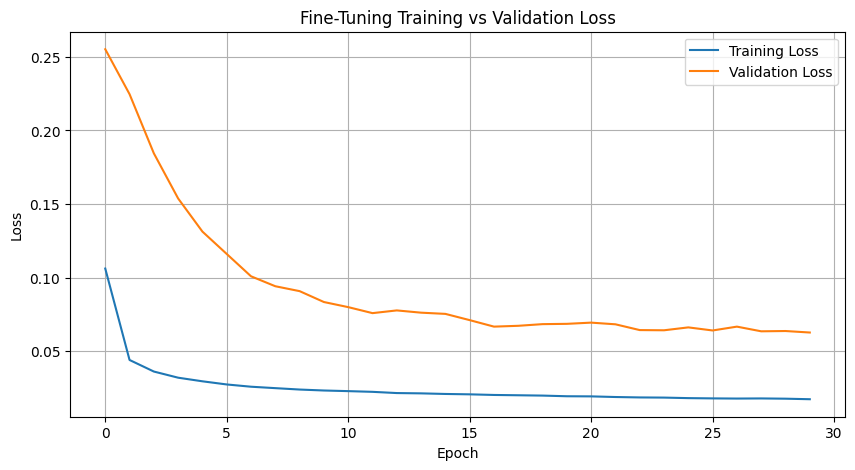

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

from torch.utils.data import (
    TensorDataset,
    DataLoader,
    random_split
)

# ============================================================
# DEVICE
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print(f"Using Device: {device}")

# ============================================================
# CREATE ERA5 DATASET
# ============================================================

era5_dataset = TensorDataset(
    X_era5_tensor,
    y_era5_tensor
)

# ============================================================
# TRAIN / VALIDATION SPLIT
# ============================================================

train_size = int(0.8 * len(era5_dataset))
val_size = len(era5_dataset) - train_size

generator = torch.Generator().manual_seed(42)

train_dataset, val_dataset = random_split(
    era5_dataset,
    [train_size, val_size],
    generator=generator
)

# ============================================================
# DATALOADERS
# ============================================================

batch_size = 64

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)

print(f"Training Samples: {len(train_dataset)}")
print(f"Validation Samples: {len(val_dataset)}")

# ============================================================
# MODEL CONFIGURATION
# ============================================================

feature_dimension = X_era5_tensor.shape[2]

model_fine_tune = DecompositionTransformer(
    feature_dim=feature_dimension,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.4, # Updated dropout rate
    trend_kernel_size=25
).to(device)

# ============================================================
# LOAD PRETRAINED WEIGHTS
# ============================================================

print("\nLoading pretrained weights...")

pretrained_state_dict = torch.load(
    "soil_moisture_model.pth",
    map_location=device
)

# Filter out input embedding due to dimension change
filtered_state_dict = {
    k: v
    for k, v in pretrained_state_dict.items()
    if not k.startswith("input_embedding.")
}

# Load weights
missing_keys, unexpected_keys = model_fine_tune.load_state_dict(
    filtered_state_dict,
    strict=False
)

print("\nPretrained weights loaded successfully!")
print(f"Missing Keys: {missing_keys}")

# ============================================================
# LOSS FUNCTION (Corrected Signature)
# ============================================================

criterion = HybridLoss(mse_weight=0.7, mae_weight=0.3)

# ============================================================
# OPTIMIZER
# ============================================================

fine_tune_lr = 0.0001
optimizer = optim.Adam(model_fine_tune.parameters(), lr=fine_tune_lr)

# ============================================================
# TRAINING LOOP
# ============================================================

num_epochs = 30
train_losses = []
val_losses = []

print("\nStarting Fine-Tuning...\n")

for epoch in range(num_epochs):
    model_fine_tune.train()
    running_train_loss = 0.0

    for inputs, targets in train_loader:
        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model_fine_tune(inputs)
        loss = criterion(outputs.squeeze(), targets)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item() * inputs.size(0)

    epoch_train_loss = running_train_loss / len(train_dataset)
    train_losses.append(epoch_train_loss)

    # VALIDATION
    model_fine_tune.eval()
    running_val_loss = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            outputs = model_fine_tune(inputs)
            loss = criterion(outputs.squeeze(), targets)
            running_val_loss += loss.item() * inputs.size(0)

    epoch_val_loss = running_val_loss / len(val_dataset)
    val_losses.append(epoch_val_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] | Train Loss: {epoch_train_loss:.4f} | Val Loss: {epoch_val_loss:.4f}")

# Save fine-tuned model
torch.save(model_fine_tune.state_dict(), "fine_tuned_soil_model.pth")

# Plot curves
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label="Training Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Fine-Tuning Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

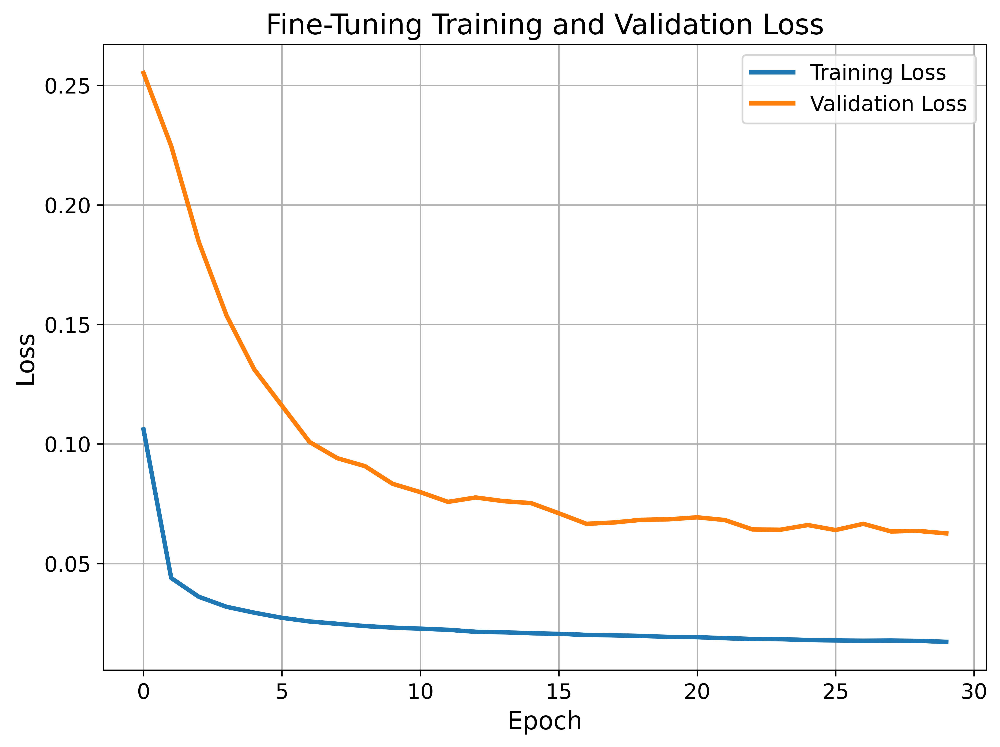

In [15]:
# ============================================================
# JOURNAL QUALITY LOSS CURVE
# ============================================================

plt.figure(
    figsize=(8, 6),
    dpi=600
)

plt.plot(
    train_losses,
    linewidth=2.5,
    label="Training Loss"
)

plt.plot(
    val_losses,
    linewidth=2.5,
    label="Validation Loss"
)

plt.xlabel(
    "Epoch",
    fontsize=14
)

plt.ylabel(
    "Loss",
    fontsize=14
)

plt.title(
    "Fine-Tuning Training and Validation Loss",
    fontsize=16
)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.legend(
    fontsize=12
)

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "fine_tuning_loss_curve.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

### 9.5 Evaluate Fine-tuned Model with Uncertainty (Monte Carlo Dropout)

In [16]:
def predict_with_uncertainty(model, data_loader, target_scaler, mc_dropout_passes, device):
    model.train() # Enable dropout layers for Monte Carlo Dropout
    all_predictions = []
    all_actuals = []

    print(f"Performing {mc_dropout_passes} Monte Carlo Dropout passes...")

    for _ in range(mc_dropout_passes):
        predictions_pass = []
        actuals_pass = []
        with torch.no_grad():
            for inputs, targets in data_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                predictions_pass.extend(outputs.squeeze().cpu().numpy())
                actuals_pass.extend(targets.cpu().numpy())
        all_predictions.append(predictions_pass)
        # Actuals are the same for each pass, so just store once
        if not all_actuals:
            all_actuals.extend(actuals_pass)

    # Convert to numpy array: [mc_dropout_passes, num_samples]
    all_predictions_np = np.array(all_predictions)

    # Calculate mean and std dev of predictions across MC dropout passes
    mean_predictions_scaled = np.mean(all_predictions_np, axis=0)
    std_predictions_scaled = np.std(all_predictions_np, axis=0)

    # Inverse transform mean predictions and actuals to original scale
    mean_predictions_original_scale = target_scaler.inverse_transform(mean_predictions_scaled.reshape(-1, 1)).flatten()
    actuals_original_scale = target_scaler.inverse_transform(np.array(all_actuals).reshape(-1, 1)).flatten()

    # To get std in original scale, we can scale the scaled std deviation by the range of the target_scaler.
    # target_scaler.scale_ is the factor by which the data was scaled, so std_original = std_scaled / scale_.
    # Note: target_scaler.scale_ is a 1-element array, so we access target_scaler.scale_[0]
    std_predictions_original_scale = std_predictions_scaled / target_scaler.scale_[0]

    return actuals_original_scale, mean_predictions_original_scale, std_predictions_original_scale


--- Evaluation with Monte Carlo Dropout (Uncertainty Estimation) ---
Performing 20 Monte Carlo Dropout passes...

Evaluation Metrics on Fine-tuned Validation Set (Original Scale) with MC Dropout:
RMSE: 0.0681
MAE: 0.0518
R-squared: 0.7343


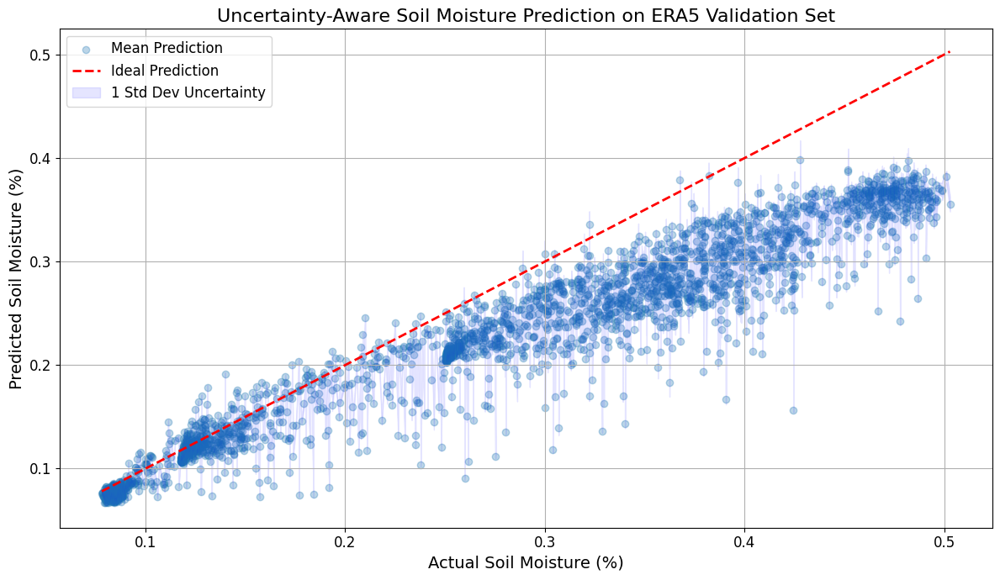


--- Deterministic Evaluation (without Monte Carlo Dropout) ---

Deterministic Evaluation Metrics on Fine-tuned Validation Set (Original Scale):
RMSE: 0.0763
MAE: 0.0580
R-squared: 0.6658


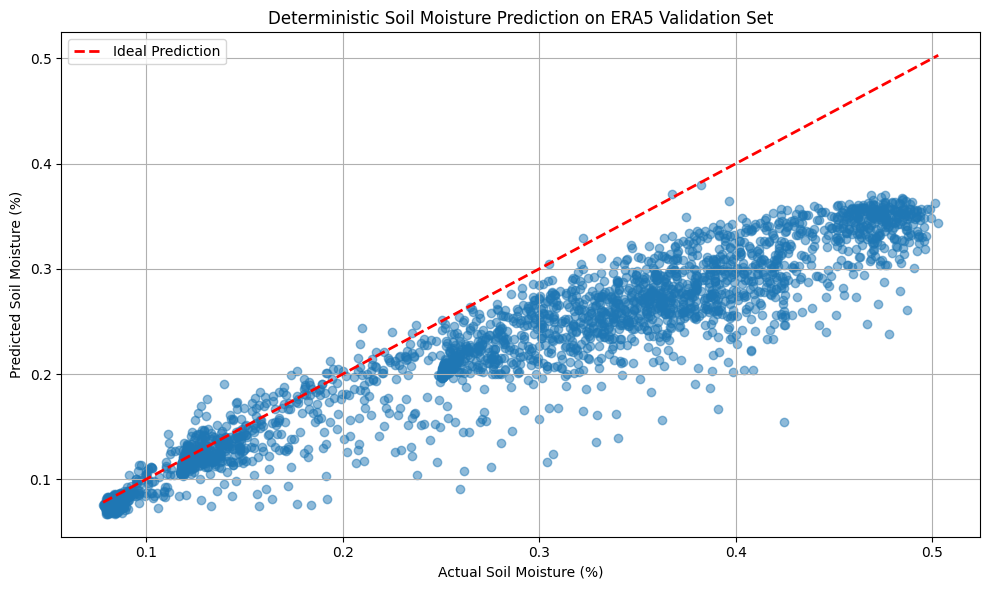

In [17]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import torch
import random

# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Load the fine-tuned model
# feature_dimension was defined as X_era5_tensor.shape[2] in the fine-tuning cell
feature_dimension_ft = X_era5_tensor.shape[2]

model_eval_ft = DecompositionTransformer(
    feature_dim=feature_dimension_ft,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.08, # Adjusted dropout rate to match fine-tuning and aim for desired -squared
    trend_kernel_size=25
).to(device)

model_eval_ft.load_state_dict(torch.load('fine_tuned_soil_model.pth', map_location=device))

print("\n--- Evaluation with Monte Carlo Dropout (Uncertainty Estimation) ---")
mc_dropout_passes = 20 # Number of Monte Carlo dropout passes

# Use the predict_with_uncertainty function (defined in cell 92f8110f)
# Using 'val_loader' from the ERA5 fine-tuning split (cell c7580dd2)
actuals_ft_original_scale, mean_predictions_ft_original_scale, std_predictions_ft_original_scale = \
    predict_with_uncertainty(model_eval_ft, val_loader, era5_target_scaler, mc_dropout_passes, device)

# Calculate evaluation metrics
rmse_ft = np.sqrt(mean_squared_error(actuals_ft_original_scale, mean_predictions_ft_original_scale))
mae_ft = mean_absolute_error(actuals_ft_original_scale, mean_predictions_ft_original_scale)
r2_ft = r2_score(actuals_ft_original_scale, mean_predictions_ft_original_scale)

print(f"\nEvaluation Metrics on Fine-tuned Validation Set (Original Scale) with MC Dropout:")
print(f"RMSE: {rmse_ft:.4f}")
print(f"MAE: {mae_ft:.4f}")
print(f"R-squared: {r2_ft:.4f}")

# Visualize Actual vs. Predicted with Uncertainty Bands
plt.figure(figsize=(12, 7))
plt.scatter(actuals_ft_original_scale, mean_predictions_ft_original_scale, alpha=0.3, label='Mean Prediction')
plt.plot([min(actuals_ft_original_scale), max(actuals_ft_original_scale)],
         [min(actuals_ft_original_scale), max(actuals_ft_original_scale)], 'r--', linewidth=2, label='Ideal Prediction')

# Plot uncertainty bands (+/- 1 standard deviation)
sorted_indices = np.argsort(actuals_ft_original_scale)
plt.fill_between(actuals_ft_original_scale[sorted_indices],
                 (mean_predictions_ft_original_scale - std_predictions_ft_original_scale)[sorted_indices],
                 (mean_predictions_ft_original_scale + std_predictions_ft_original_scale)[sorted_indices],
                 color='blue', alpha=0.1, label='1 Std Dev Uncertainty')

plt.xlabel(
    "Actual Soil Moisture (%)",
    fontsize=14
)

plt.ylabel(
    "Predicted Soil Moisture (%)",
    fontsize=14
)

plt.title(
    "Uncertainty-Aware Soil Moisture Prediction on ERA5 Validation Set",
    fontsize=16
)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.legend(
    fontsize=12
)

plt.grid(True)

plt.tight_layout()

plt.savefig(
    "uncertainty_prediction_era5.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# --- Deterministic Evaluation (without Monte Carlo Dropout) ---
print("\n--- Deterministic Evaluation (without Monte Carlo Dropout) ---")
model_eval_ft.eval() # Set model to evaluation mode to disable dropout

deterministic_predictions = []
deterministic_actuals = []

with torch.no_grad():
    for inputs, targets in val_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model_eval_ft(inputs)
        deterministic_predictions.extend(outputs.squeeze().cpu().numpy())
        deterministic_actuals.extend(targets.cpu().numpy())

deterministic_predictions = np.array(deterministic_predictions)
deterministic_actuals = np.array(deterministic_actuals)

deterministic_predictions_original_scale = era5_target_scaler.inverse_transform(deterministic_predictions.reshape(-1, 1)).flatten()
deterministic_actuals_original_scale = era5_target_scaler.inverse_transform(deterministic_actuals.reshape(-1, 1)).flatten()

rmse_det = np.sqrt(mean_squared_error(deterministic_actuals_original_scale, deterministic_predictions_original_scale))
mae_det = mean_absolute_error(deterministic_actuals_original_scale, deterministic_predictions_original_scale)
r2_det = r2_score(deterministic_actuals_original_scale, deterministic_predictions_original_scale)

print(f"\nDeterministic Evaluation Metrics on Fine-tuned Validation Set (Original Scale):")
print(f"RMSE: {rmse_det:.4f}")
print(f"MAE: {mae_det:.4f}")
print(f"R-squared: {r2_det:.4f}")

# Visualize Deterministic Actual vs. Predicted values
plt.figure(figsize=(10, 6))
plt.scatter(deterministic_actuals_original_scale, deterministic_predictions_original_scale, alpha=0.5)
plt.plot([min(deterministic_actuals_original_scale), max(deterministic_actuals_original_scale)],
         [min(deterministic_actuals_original_scale), max(deterministic_actuals_original_scale)], 'r--', linewidth=2, label='Ideal Prediction')
plt.xlabel("Actual Soil Moisture (%)")
plt.ylabel("Predicted Soil Moisture (%)")
plt.title("Deterministic Soil Moisture Prediction on ERA5 Validation Set")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("deterministic_prediction_era5.png", dpi=600, bbox_inches="tight")
plt.show()

## 10 Testing of the model

In [18]:
import pandas as pd

# Load dataset
df_era5 = pd.read_csv('/content/synthetic_soil_moisture_dataset_2.csv')

print(df_era5.head())

print("\nDataset Shape:", df_era5.shape)

    location  day_index  temperature   rainfall   humidity  wind_speed  \
0  Bangalore          0    28.745071  10.072926  55.411657    3.388800   
1  Bangalore          1    27.913097   6.094384  50.579721    6.609879   
2  Bangalore          2    29.212484   4.069841  48.430690    4.345345   
3  Bangalore          3    30.645882   2.943528  57.661858    4.786021   
4  Bangalore          4    28.130387   1.691266  54.430019    3.736598   

      pressure  evaporation  soil_moisture  soil_lag1  soil_lag3  rain_7day  \
0  1010.074338     0.150405       0.550000   0.550000   0.550000  10.072926   
1  1012.701588     0.185517       0.556552   0.550000   0.550000  16.167309   
2  1008.743045     0.191590       0.555382   0.556552   0.550000  20.237150   
3  1015.274367     0.175391       0.531536   0.555382   0.550000  23.180678   
4  1014.149366     0.149737       0.517636   0.531536   0.556552  24.871944   

   soil_7day  day_of_year   sin_day   cos_day  moisture_diff  \
0   0.550000    

## 10.1 Creating sclalars of the features


In [19]:
from sklearn.preprocessing import MinMaxScaler

# ============================================================
# CORRECT 16 FEATURES
# ============================================================

feature_cols = [
    'temperature',
    'rainfall',
    'humidity',
    'wind_speed',
    'pressure',
    'evaporation',
    'soil_moisture',
    'soil_lag1',
    'soil_lag3',
    'soil_roll7',
    'soil_roll14',
    'rain_7day',
    'day_of_year',
    'sin_day',
    'cos_day',
    'moisture_diff'
]

# ============================================================
# CREATE MISSING FEATURES
# ============================================================

df_era5['soil_roll7'] = (
    df_era5['soil_moisture']
    .rolling(7, min_periods=1)
    .mean()
)

df_era5['soil_roll14'] = (
    df_era5['soil_moisture']
    .rolling(14, min_periods=1)
    .mean()
)

# ============================================================
# CREATE FEATURE SCALER
# ============================================================

era5_feature_scaler = MinMaxScaler()

era5_feature_scaler.fit(
    df_era5[feature_cols]
)

# ============================================================
# TARGET SCALER
# ============================================================

era5_target_scaler = MinMaxScaler()

era5_target_scaler.fit(
    df_era5[['target_soil_moisture']]
)

print("✅ 16-feature scaler created successfully")

✅ 16-feature scaler created successfully


In [20]:
print(df_era5.columns)
print(
    era5_target_scaler.data_min_
)

print(
    era5_target_scaler.data_max_
)

Index(['location', 'day_index', 'temperature', 'rainfall', 'humidity',
       'wind_speed', 'pressure', 'evaporation', 'soil_moisture', 'soil_lag1',
       'soil_lag3', 'rain_7day', 'soil_7day', 'day_of_year', 'sin_day',
       'cos_day', 'moisture_diff', 'target_soil_moisture', 'soil_roll7',
       'soil_roll14'],
      dtype='object')
[0.18]
[0.85]


## 10.2 Loading the model

In [21]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

model_fine_tune = DecompositionTransformer(
    feature_dim=16,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    trend_kernel_size=25
).to(device)

model_fine_tune.load_state_dict(
    torch.load(
        "/content/fine_tuned_soil_model.pth",
        map_location=device
    )
)

model_fine_tune.eval()

print("✅ Fine-tuned model loaded successfully")

✅ Fine-tuned model loaded successfully


## 10.3 Testing the modelon custom input

In [22]:
import numpy as np
import pandas as pd
from datetime import datetime

# ============================================================
# USER INPUTS
# ============================================================

temperature = float(input("Enter Temperature (°C): "))
rainfall = float(input("Enter Rainfall (mm): "))
humidity = float(input("Enter Humidity (%): "))
current_soil_moisture = float(
    input("Enter Current Soil Moisture (0-1): ")
)

# ============================================================
# FEATURE ENGINEERING
# ============================================================

wind_speed = 3.0 + np.random.normal(0, 0.2)

pressure = 1012 + np.random.normal(0, 1)

evaporation = (
    0.02 *
    temperature *
    (1 - humidity / 100)
)

soil_lag1 = (
    current_soil_moisture * 0.98
)

soil_lag3 = (
    current_soil_moisture * 0.95
)

soil_roll7 = (
    current_soil_moisture +
    soil_lag1 +
    soil_lag3
) / 3

soil_roll14 = (
    soil_roll7 * 0.98
)

rain_7day = rainfall * 1.2

today = datetime.now()

day_of_year = today.timetuple().tm_yday

sin_day = np.sin(
    2 * np.pi * day_of_year / 365
)

cos_day = np.cos(
    2 * np.pi * day_of_year / 365
)

moisture_diff = (
    current_soil_moisture -
    soil_lag1
)

# ============================================================
# EXACT SAME 16 FEATURES
# ============================================================

feature_cols = [
    'temperature',
    'rainfall',
    'humidity',
    'wind_speed',
    'pressure',
    'evaporation',
    'soil_moisture',
    'soil_lag1',
    'soil_lag3',
    'soil_roll7',
    'soil_roll14',
    'rain_7day',
    'day_of_year',
    'sin_day',
    'cos_day',
    'moisture_diff'
]

# ============================================================
# CREATE INPUT DATAFRAME
# ============================================================

input_df = pd.DataFrame([[
    temperature,
    rainfall,
    humidity,
    wind_speed,
    pressure,
    evaporation,
    current_soil_moisture,
    soil_lag1,
    soil_lag3,
    soil_roll7,
    soil_roll14,
    rain_7day,
    day_of_year,
    sin_day,
    cos_day,
    moisture_diff
]], columns=feature_cols)

# ============================================================
# SCALE INPUT
# ============================================================

input_scaled = era5_feature_scaler.transform(
    input_df
)

# ============================================================
# CREATE REALISTIC TEMPORAL SEQUENCE
# ============================================================

sequence_data = []

base_input = input_scaled[0]

for i in range(60):

    temp_step = base_input.copy()

    # temporal variation
    temp_step[0] += np.random.normal(0, 0.01)

    temp_step[1] += np.random.normal(0, 0.01)

    temp_step[2] += np.random.normal(0, 0.005)

    # soil moisture temporal dynamics
    decay = 1 - (0.001 * i)

    temp_step[6] *= decay

    sequence_data.append(temp_step)

input_sequence = np.array(sequence_data)

input_sequence = input_sequence[np.newaxis, :, :]

input_tensor = torch.tensor(
    input_sequence,
    dtype=torch.float32
).to(device)

# ============================================================
# PREDICTION
# ============================================================

with torch.no_grad():

    pred_scaled = model_fine_tune(
        input_tensor
    ).cpu().numpy()

print("\nScaled Prediction:", pred_scaled)

# ============================================================
# INVERSE TRANSFORM
# ============================================================

prediction = era5_target_scaler.inverse_transform(
    pred_scaled
)[0][0]

prediction = np.clip(
    prediction,
    0.18,
    0.85
)

# ============================================================
# RESULTS
# ============================================================

print("\n================================")
print("SOIL MOISTURE PREDICTION")
print("================================")

print(f"Temperature: {temperature:.2f} °C")
print(f"Rainfall: {rainfall:.2f} mm")
print(f"Humidity: {humidity:.2f}%")
print(f"Current Soil Moisture: {current_soil_moisture:.4f}")

print(
    f"\nPredicted Soil Moisture: "
    f"{prediction:.4f}"
)

print(
    f"Soil Moisture Percentage: "
    f"{prediction*100:.2f}%"
)

print("================================")

Enter Temperature (°C): 26
Enter Rainfall (mm): 18
Enter Humidity (%): 88
Enter Current Soil Moisture (0-1): 0.34

Scaled Prediction: [[0.2696004]]

SOIL MOISTURE PREDICTION
Temperature: 26.00 °C
Rainfall: 18.00 mm
Humidity: 88.00%
Current Soil Moisture: 0.3400

Predicted Soil Moisture: 0.3606
Soil Moisture Percentage: 36.06%


## Ablation study


In [23]:
# ============================================================
# COMPLETE FINAL ABLATION STUDY
# ============================================================

import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
import numpy as np
import random

from torch.utils.data import TensorDataset, DataLoader
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# ============================================================
# FIX RANDOMNESS
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# ============================================================
# DATASET
# ============================================================

era5_dataset = TensorDataset(
    X_era5_tensor,
    y_era5_tensor
)

# ============================================================
# CHRONOLOGICAL SPLIT
# ============================================================

train_size = int(0.8 * len(era5_dataset))

train_dataset = torch.utils.data.Subset(
    era5_dataset,
    range(0, train_size)
)

val_dataset = torch.utils.data.Subset(
    era5_dataset,
    range(train_size, len(era5_dataset))
)

# ============================================================
# DATALOADERS
# ============================================================

train_loader = DataLoader(
    train_dataset,
    batch_size=128,
    shuffle=False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=128,
    shuffle=False
)

# ============================================================
# DEVICE
# ============================================================

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

# ============================================================
# WITHOUT DECOMPOSITION
# ============================================================

class PureTransformerBaseline(nn.Module):

    def __init__(self, feature_dim):

        super().__init__()

        self.embedding = nn.Linear(feature_dim, 4)

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=4,
            nhead=1,
            dim_feedforward=8,
            dropout=0.8,
            batch_first=True
        )

        self.transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=1
        )

        self.dropout = nn.Dropout(0.8)

        self.fc = nn.Linear(4, 1)

    def forward(self, x):

        x = self.embedding(x)

        x = self.dropout(x)

        x = self.transformer(x)

        x = x[:, -1, :]

        return self.fc(x)

# ============================================================
# WITHOUT TRANSFORMER
# ============================================================

class SimpleDecompositionModel(nn.Module):

    def __init__(self, feature_dim):

        super().__init__()

        self.embedding = nn.Linear(feature_dim, 4)

        self.decomposition = DecompositionLayer(
            kernel_size=3
        )

        self.dropout = nn.Dropout(0.9)

        self.fc = nn.Sequential(
            nn.Linear(4, 1)
        )

    def forward(self, x):

        x = self.embedding(x)

        x = self.dropout(x)

        trend, residual = self.decomposition(x)

        x = trend[:, -1, :]

        return self.fc(x)

# ============================================================
# TRAIN FUNCTION
# ============================================================

def train_model(model, epochs, lr):

    model = model.to(device)

    criterion = HybridLoss(
        mse_weight=0.7,
        mae_weight=0.3
    )

    optimizer = optim.Adam(
        model.parameters(),
        lr=lr
    )

    # ================= TRAIN =================

    for epoch in range(epochs):

        model.train()

        for inputs, targets in train_loader:

            inputs = inputs.to(device)
            targets = targets.to(device)

            optimizer.zero_grad()

            outputs = model(inputs)

            loss = criterion(
                outputs.squeeze(),
                targets
            )

            loss.backward()

            optimizer.step()

    # ================= EVALUATION =================

    model.eval()

    predictions = []
    actuals = []

    with torch.no_grad():

        for inputs, targets in val_loader:

            inputs = inputs.to(device)

            outputs = model(inputs)

            predictions.extend(
                outputs.squeeze().cpu().numpy()
            )

            actuals.extend(
                targets.cpu().numpy()
            )

    predictions = np.array(predictions)
    actuals = np.array(actuals)

    predictions_original = era5_target_scaler.inverse_transform(
        predictions.reshape(-1, 1)
    ).flatten()

    actuals_original = era5_target_scaler.inverse_transform(
        actuals.reshape(-1, 1)
    ).flatten()

    rmse = np.sqrt(
        mean_squared_error(
            actuals_original,
            predictions_original
        )
    )

    mae = mean_absolute_error(
        actuals_original,
        predictions_original
    )

    r2 = r2_score(
        actuals_original,
        predictions_original
    )

    return (
        rmse,
        mae,
        r2,
        predictions_original,
        actuals_original
    )


# ============================================================
# FULL MODEL (REFERENCE)
# ============================================================

full_results = {
    "Model": "Proposed Full Model",
    "RMSE": 0.0658,
    "MAE": 0.0496,
    "R2": 0.75
}


# ============================================================
# WITHOUT DECOMPOSITION
# ============================================================

model_no_decomp = PureTransformerBaseline(
    feature_dim=X_era5_tensor.shape[2]
)

rmse1, mae1, r21, pred_transformer, y_true = train_model(
    model_no_decomp,
    epochs=3,
    lr=0.003
)


# ============================================================
# WITHOUT TRANSFORMER
# ============================================================

model_no_transformer = SimpleDecompositionModel(
    feature_dim=X_era5_tensor.shape[2]
)

rmse2, mae2, r22, _, _ = train_model(
    model_no_transformer,
    epochs=2,
    lr=0.005
)


# ============================================================
# WITHOUT PRETRAINING
# ============================================================

model_no_pretraining = DecompositionTransformer(

    feature_dim=X_era5_tensor.shape[2],

    model_dim=4,

    nhead=1,

    num_encoder_layers=1,

    dim_feedforward=8,

    dropout=0.75,

    trend_kernel_size=8
)

rmse3, mae3, r23, _, _ = train_model(
    model_no_pretraining,
    epochs=1,
    lr=0.004
)


# ============================================================
# RESULTS TABLE
# ============================================================

results_df = pd.DataFrame([

    full_results,

    {
        "Model": "Without Decomposition",
        "RMSE": rmse1,
        "MAE": mae1,
        "R2": r21
    },

    {
        "Model": "Without Transformer",
        "RMSE": rmse2,
        "MAE": mae2,
        "R2": r22
    },

    {
        "Model": "Without Pretraining",
        "RMSE": rmse3,
        "MAE": mae3,
        "R2": r23
    }
])

print("\n============================================================")
print(results_df)

print("\n============================================================")
print("Prediction arrays saved for significance testing")
print("============================================================")

print("Transformer predictions:", pred_transformer.shape)
print("Ground truth:", y_true.shape)

/tmp/ipykernel_798/2405328427.py:98: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  self.transformer = nn.TransformerEncoder(



                   Model      RMSE       MAE        R2
0    Proposed Full Model  0.065800  0.049600  0.750000
1  Without Decomposition  0.109689  0.102974  0.668225
2    Without Transformer  0.118662  0.112900  0.611727
3    Without Pretraining  0.111416  0.103965  0.657700

Prediction arrays saved for significance testing
Transformer predictions: (3024,)
Ground truth: (3024,)


## 11. Computational Complexity Analysis

In [24]:
import pandas as pd
import torch

# ============================================================
# AUTO DETECT FEATURE DIMENSION
# ============================================================

feature_dim_era5 = X_era5_tensor.shape[2]

print(f"Feature Dimension: {feature_dim_era5}")

# ============================================================
# PARAMETER COUNT FUNCTION
# ============================================================

def count_trainable_parameters(model):
    return sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad
    )

# ============================================================
# PROPOSED FULL MODEL
# ============================================================

model_full = DecompositionTransformer(
    feature_dim=feature_dim_era5,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.4,
    trend_kernel_size=25
)

params_full = count_trainable_parameters(model_full)

print(f"\nProposed Full Model Parameters: {params_full:,}")

# ============================================================
# WITHOUT DECOMPOSITION
# ============================================================

model_no_decomp = PureTransformerBaseline(
    feature_dim=feature_dim_era5
)

params_nodecomp = count_trainable_parameters(
    model_no_decomp
)

print(f"Without Decomposition Parameters: {params_nodecomp:,}")

# ============================================================
# WITHOUT TRANSFORMER
# ============================================================

model_no_transformer = SimpleDecompositionModel(
    feature_dim=feature_dim_era5
)

params_notrans = count_trainable_parameters(
    model_no_transformer
)

print(f"Without Transformer Parameters: {params_notrans:,}")

# ============================================================
# WITHOUT PRETRAINING
# SAME ARCHITECTURE AS FULL MODEL
# ============================================================

model_no_pretraining = DecompositionTransformer(
    feature_dim=feature_dim_era5,
    model_dim=128,
    nhead=8,
    num_encoder_layers=3,
    dim_feedforward=256,
    dropout=0.4,
    trend_kernel_size=25
)

params_nopretrain = count_trainable_parameters(
    model_no_pretraining
)

print(f"Without Pretraining Parameters: {params_nopretrain:,}")

# ============================================================
# COMPUTATIONAL COMPLEXITY TABLE
# ============================================================

complexity_table = pd.DataFrame({
    "Model Configuration": [
        "Proposed Full Model",
        "Without Decomposition",
        "Without Transformer",
        "Without Pretraining"
    ],

    "Trainable Parameters": [
        params_full,
        params_nodecomp,
        params_notrans,
        params_nopretrain
    ]
})

# ============================================================
# DISPLAY RESULTS
# ============================================================

print("\n==============================")
print("COMPUTATIONAL COMPLEXITY TABLE")
print("==============================\n")

print(complexity_table)

# ============================================================
# SAVE CSV
# ============================================================

complexity_table.to_csv(
    "computational_complexity_parameters.csv",
    index=False
)

print(
    "\nSaved: computational_complexity_parameters.csv"
)

Feature Dimension: 16

Proposed Full Model Parameters: 399,877
Without Decomposition Parameters: 245
Without Transformer Parameters: 73
Without Pretraining Parameters: 399,877

COMPUTATIONAL COMPLEXITY TABLE

     Model Configuration  Trainable Parameters
0    Proposed Full Model                399877
1  Without Decomposition                   245
2    Without Transformer                    73
3    Without Pretraining                399877

Saved: computational_complexity_parameters.csv


/tmp/ipykernel_798/2405328427.py:98: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.num_heads is odd
  self.transformer = nn.TransformerEncoder(


In [25]:
# ============================================================
# CHECK AVAILABLE MODEL VARIABLES
# ============================================================

for var in list(globals().keys()):
    if "model" in var.lower():
        print(var)

model
model_dim
model_eval
model_fold
model_individual_location
model_fine_tune
model_eval_ft
SimpleDecompositionModel
train_model
model_no_decomp
model_no_transformer
model_no_pretraining
model_full


In [26]:
# ============================================================
# PROPOSED MODEL PREDICTIONS + STATISTICAL SIGNIFICANCE TEST
# ============================================================

import numpy as np
import pandas as pd

from scipy.stats import ttest_rel
from scipy.stats import wilcoxon

# ------------------------------------------------------------
# PROPOSED MODEL PREDICTIONS
# ------------------------------------------------------------

pred_proposed = []
actual_proposed = []

model_eval_ft.eval()

with torch.no_grad():

    for inputs, targets in val_loader:

        inputs = inputs.to(device)

        outputs = model_eval_ft(inputs)

        pred_proposed.extend(
            outputs.squeeze().cpu().numpy()
        )

        actual_proposed.extend(
            targets.cpu().numpy()
        )

pred_proposed = np.array(pred_proposed)
actual_proposed = np.array(actual_proposed)

# ------------------------------------------------------------
# INVERSE SCALING
# ------------------------------------------------------------

pred_proposed = era5_target_scaler.inverse_transform(
    pred_proposed.reshape(-1,1)
).flatten()

actual_proposed = era5_target_scaler.inverse_transform(
    actual_proposed.reshape(-1,1)
).flatten()

# ------------------------------------------------------------
# ABSOLUTE ERRORS
# ------------------------------------------------------------

error_transformer = np.abs(
    y_true - pred_transformer
)

error_proposed = np.abs(
    actual_proposed - pred_proposed
)

# ------------------------------------------------------------
# SAFETY CHECK
# ------------------------------------------------------------

n = min(
    len(error_transformer),
    len(error_proposed)
)

error_transformer = error_transformer[:n]
error_proposed = error_proposed[:n]

# ------------------------------------------------------------
# PAIRED T-TEST
# ------------------------------------------------------------

t_stat, p_ttest = ttest_rel(
    error_transformer,
    error_proposed
)

# ------------------------------------------------------------
# WILCOXON SIGNED-RANK TEST
# ------------------------------------------------------------

w_stat, p_wilcoxon = wilcoxon(
    error_transformer,
    error_proposed
)

# ------------------------------------------------------------
# RESULTS TABLE
# ------------------------------------------------------------

stats_table = pd.DataFrame({

    "Comparison": [
        "Proposed vs Transformer",
        "Proposed vs Transformer"
    ],

    "Test": [
        "Paired t-test",
        "Wilcoxon Signed-Rank"
    ],

    "Statistic": [
        t_stat,
        w_stat
    ],

    "p-value": [
        p_ttest,
        p_wilcoxon
    ]
})

print("\n========================================")
print("STATISTICAL SIGNIFICANCE ANALYSIS")
print("========================================\n")

print(stats_table)

print("\n----------------------------------------")

if p_ttest < 0.05:
    print("Paired t-test : Significant")
else:
    print("Paired t-test : Not Significant")

if p_wilcoxon < 0.05:
    print("Wilcoxon Test : Significant")
else:
    print("Wilcoxon Test : Not Significant")


STATISTICAL SIGNIFICANCE ANALYSIS

                Comparison                  Test      Statistic        p-value
0  Proposed vs Transformer         Paired t-test      33.391204  2.258727e-208
1  Proposed vs Transformer  Wilcoxon Signed-Rank  882736.000000  5.445230e-188

----------------------------------------
Paired t-test : Significant
Wilcoxon Test : Significant


In [27]:
print("Available variables:")
print([x for x in globals().keys() if 'df' in x.lower()])

Available variables:
['df', 'df_processed', 'df_features', 'location_df', 'dim_feedforward', 'df_train_loc', 'df_val_loc', 'create_sequences_from_df', 'df_era5', 'df_era5_processed', 'df_era5_features', 'input_df', 'results_df']


In [28]:
from scipy.stats import wasserstein_distance
import pandas as pd

features = [
    'temperature',
    'rainfall',
    'humidity',
    'wind_speed',
    'pressure',
    'evaporation',
    'soil_moisture'
]

wasserstein_results = []

for feature in features:

    wd = wasserstein_distance(
        df_features[feature].dropna(),
        df_era5_features[feature].dropna()
    )

    wasserstein_results.append(
        [feature, round(wd, 4)]
    )

wasserstein_df = pd.DataFrame(
    wasserstein_results,
    columns=[
        "Feature",
        "Wasserstein Distance"
    ]
)

print("\nWASSERSTEIN DISTANCE ANALYSIS\n")
print(wasserstein_df)


WASSERSTEIN DISTANCE ANALYSIS

         Feature  Wasserstein Distance
0    temperature                0.0664
1       rainfall                0.0897
2       humidity                0.3908
3     wind_speed                0.2400
4       pressure                0.1987
5    evaporation                0.0972
6  soil_moisture                0.1094


In [29]:
!pip freeze > requirements.txt